In [1]:
import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
import random
from scipy.spatial import distance
def generate_points(N):
    # Generate N points for x and y separately
    x = np.random.randn(N)*150
    y = np.random.randn(N)*150
    min_x = min(x)
    min_y = min(y)
    x = x - min_x - min_y
    y = y - min_x - min_y
    x = np.rint(x)
    y = np.rint(y)
    # Create a DataFrame from the points
    df = pd.DataFrame({'X': x, 'Y': y})
    # Rename the index to "Node"
    df.index.rename('Node', inplace=True)
    df.index += 1
    return df

In [2]:
Node_df = generate_points(500)
x = Node_df['X']
y = Node_df['Y']
Node_df['X'] = Node_df['X'].astype(int)
Node_df['Y'] = Node_df['Y'].astype(int)

In [3]:
def create_connections(df):
    nodes = df.index.values
    coords = df.values
    dist_matrix = distance.cdist(coords, coords, 'cityblock')
    df_dist = pd.DataFrame(dist_matrix, index=nodes, columns=nodes)
    connections = []

    for node in nodes:
        # get 4 closest nodes because the closest one will be the node itself with a distance of 0
        closest_nodes = df_dist[node].nsmallest(4).index.values
        for close_node in closest_nodes:
            # prevent connection with itself
            if node != close_node:
                connections.append([node, close_node])
    
    df_connections = pd.DataFrame(connections, columns=['A', 'B'])
    return df_connections

In [4]:
Connection_df = create_connections(Node_df)

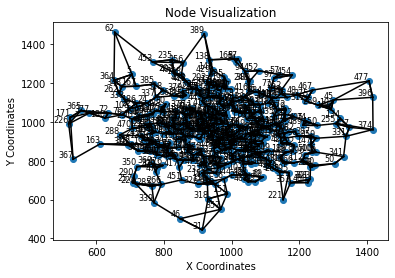

In [5]:
plt.scatter(x, y)
plt.xlabel('X Coordinates')
plt.ylabel('Y Coordinates')
plt.title('Node Visualization')
for i, (x_coord, y_coord) in enumerate(zip(x, y)):
    plt.text(x_coord, y_coord, str(i+1), fontsize=8, verticalalignment='bottom', horizontalalignment='right')
for _, row in Connection_df.iterrows():
    start_node = row['A']
    end_node = row['B']
    plt.plot([x[start_node], x[end_node]], [y[start_node], y[end_node]], 'k-')
plt.show()

In [6]:
import numpy as np
import pandas as pd

def calculate_capacity(node_df, connection_df, min_population=5000, max_population=15000):
    # Assign population to each node using normal distribution
    np.random.seed(42)  # Set a seed for reproducibility
    node_df['Population'] = np.random.randint(min_population, max_population, size=len(node_df))

    # Calculate capacity of each connection by summing node populations
    connection_df['capacity'] = node_df.loc[connection_df['A'], 'Population'].values + \
                                node_df.loc[connection_df['B'], 'Population'].values

    # Create a DataFrame with 'init_node', 'term_node', and 'capacity' columns
    connection_df['capacity'] = connection_df['capacity'].astype(float)  # Convert capacity to float

    output_df = connection_df[['A', 'B', 'capacity']].rename(columns={'A': 'init_node', 'B': 'term_node'})

    return output_df

In [7]:
Data = calculate_capacity(Node_df, Connection_df)

In [8]:
import pandas as pd
import networkx as nx
import concurrent.futures

# Read the DataFrame with connections and capacities
df = Data

# Create a directed graph
G = nx.DiGraph()

# Convert capacity to integers
df['capacity'] = df['capacity'].astype(float)

# Add nodes to the graph
G.add_nodes_from(df['init_node'])
G.add_nodes_from(df['term_node'])

# Add edges to the graph with capacities as edge attributes
for _, row in df.iterrows():
    init_node = row['init_node']
    term_node = row['term_node']
    capacity = row['capacity']
    G.add_edge(init_node, term_node, capacity=capacity)

# Function to find all shortest paths for a pair of nodes
def find_shortest_paths(start_node, end_node):
    return list(nx.all_shortest_paths(G, start_node, end_node, weight='capacity'))

# Find all possible routes and select all shortest paths for each pair of nodes
routes = []
with concurrent.futures.ThreadPoolExecutor() as executor:
    future_to_pair = {executor.submit(find_shortest_paths, start_node, end_node): (start_node, end_node) for start_node in G.nodes for end_node in G.nodes}
    for future in concurrent.futures.as_completed(future_to_pair):
        pair = future_to_pair[future]
        try:
            shortest_paths = future.result()
            for path in shortest_paths:
                route_capacity = min(G[u][v]['capacity'] for u, v in zip(path, path[1:]))
                routes.append({'start_node': pair[0], 'end_node': pair[1], 'route': path, 'capacity': route_capacity})
        except Exception as e:
            print(f"An error occurred for pair {pair}: {e}")

# Convert routes to a DataFrame
Routes_df = pd.DataFrame(routes)
Routes_df['route'] = Routes_df['route'].apply(lambda route: [int(node) for node in route])

# Print the routes DataFrame
Routes_df['route_pairs'] = Routes_df['route'].apply(lambda route: [f"{node}-{next_node}" for node, next_node in zip(route, route[1:])])

An error occurred for pair (310, 89): Target 89 cannot be reached from given sources
An error occurred for pair (499, 8): Target 8 cannot be reached from given sources
An error occurred for pair (499, 7): Target 7 cannot be reached from given sources
An error occurred for pair (39, 14): Target 14 cannot be reached from given sources
An error occurred for pair (35, 88): Target 88 cannot be reached from given sources
An error occurred for pair (310, 90): Target 90 cannot be reached from given sources
An error occurred for pair (499, 5): Target 5 cannot be reached from given sources
An error occurred for pair (35, 87): Target 87 cannot be reached from given sources
An error occurred for pair (390, 197): Target 197 cannot be reached from given sources
An error occurred for pair (499, 4): Target 4 cannot be reached from given sources
An error occurred for pair (388, 135): Target 135 cannot be reached from given sources
An error occurred for pair (297, 62): Target 62 cannot be reached from g

An error occurred for pair (228, 447): Target 447 cannot be reached from given sources
An error occurred for pair (458, 320): Target 320 cannot be reached from given sources
An error occurred for pair (110, 157): Target 157 cannot be reached from given sources
An error occurred for pair (229, 74): Target 74 cannot be reached from given sources
An error occurred for pair (458, 319): Target 319 cannot be reached from given sources
An error occurred for pair (110, 156): Target 156 cannot be reached from given sources
An error occurred for pair (492, 50): Target 50 cannot be reached from given sources
An error occurred for pair (228, 445): Target 445 cannot be reached from given sources
An error occurred for pair (116, 349): Target 349 cannot be reached from given sources
An error occurred for pair (229, 56): Target 56 cannot be reached from given sources
An error occurred for pair (458, 318): Target 318 cannot be reached from given sources
An error occurred for pair (110, 155): Target 155

An error occurred for pair (307, 71): Target 71 cannot be reached from given sources
An error occurred for pair (25, 210): Target 210 cannot be reached from given sources
An error occurred for pair (466, 473): Target 473 cannot be reached from given sources
An error occurred for pair (353, 190): Target 190 cannot be reached from given sources
An error occurred for pair (351, 444): Target 444 cannot be reached from given sources
An error occurred for pair (338, 459): Target 459 cannot be reached from given sources
An error occurred for pair (20, 255): Target 255 cannot be reached from given sources
An error occurred for pair (285, 358): Target 358 cannot be reached from given sources
An error occurred for pair (466, 472): Target 472 cannot be reached from given sources
An error occurred for pair (24, 384): Target 384 cannot be reached from given sources
An error occurred for pair (350, 452): Target 452 cannot be reached from given sources
An error occurred for pair (338, 458): Target 45

An error occurred for pair (74, 343): Target 343 cannot be reached from given sources
An error occurred for pair (379, 42): Target 42 cannot be reached from given sources
An error occurred for pair (333, 250): Target 250 cannot be reached from given sources
An error occurred for pair (128, 245): Target 245 cannot be reached from given sources
An error occurred for pair (403, 115): Target 115 cannot be reached from given sources
An error occurred for pair (74, 342): Target 342 cannot be reached from given sources
An error occurred for pair (333, 249): Target 249 cannot be reached from given sources
An error occurred for pair (128, 244): Target 244 cannot be reached from given sources
An error occurred for pair (403, 114): Target 114 cannot be reached from given sources
An error occurred for pair (403, 113): Target 113 cannot be reached from given sources
An error occurred for pair (74, 341): Target 341 cannot be reached from given sources
An error occurred for pair (379, 68): Target 68 

An error occurred for pair (137, 459): Target 459 cannot be reached from given sources
An error occurred for pair (366, 336): Target 336 cannot be reached from given sources
An error occurred for pair (85, 162): Target 162 cannot be reached from given sources
An error occurred for pair (377, 57): Target 57 cannot be reached from given sources
An error occurred for pair (137, 458): Target 458 cannot be reached from given sources
An error occurred for pair (85, 161): Target 161 cannot be reached from given sources
An error occurred for pair (366, 335): Target 335 cannot be reached from given sources
An error occurred for pair (174, 431): Target 431 cannot be reached from given sources
An error occurred for pair (137, 457): Target 457 cannot be reached from given sources
An error occurred for pair (164, 332): Target 332 cannot be reached from given sources
An error occurred for pair (85, 160): Target 160 cannot be reached from given sources
An error occurred for pair (366, 334): Target 33

An error occurred for pair (285, 381): Target 381 cannot be reached from given sources
An error occurred for pair (150, 275): Target 275 cannot be reached from given sources
An error occurred for pair (312, 139): Target 139 cannot be reached from given sources
An error occurred for pair (228, 405): Target 405 cannot be reached from given sources
An error occurred for pair (338, 394): Target 394 cannot be reached from given sources
An error occurred for pair (283, 260): Target 260 cannot be reached from given sources
An error occurred for pair (150, 274): Target 274 cannot be reached from given sources
An error occurred for pair (312, 138): Target 138 cannot be reached from given sources
An error occurred for pair (229, 92): Target 92 cannot be reached from given sources
An error occurred for pair (338, 393): Target 393 cannot be reached from given sources
An error occurred for pair (283, 259): Target 259 cannot be reached from given sources
An error occurred for pair (312, 137): Target

An error occurred for pair (497, 29): Target 29 cannot be reached from given sources
An error occurred for pair (29, 248): Target 248 cannot be reached from given sources
An error occurred for pair (133, 192): Target 192 cannot be reached from given sources
An error occurred for pair (128, 231): Target 231 cannot be reached from given sources
An error occurred for pair (74, 328): Target 328 cannot be reached from given sources
An error occurred for pair (8, 332): Target 332 cannot be reached from given sources
An error occurred for pair (133, 191): Target 191 cannot be reached from given sources
An error occurred for pair (128, 230): Target 230 cannot be reached from given sources
An error occurred for pair (133, 190): Target 190 cannot be reached from given sources
An error occurred for pair (128, 229): Target 229 cannot be reached from given sources
An error occurred for pair (497, 24): Target 24 cannot be reached from given sources
An error occurred for pair (129, 20): Target 20 can

An error occurred for pair (434, 81): Target 81 cannot be reached from given sources
An error occurred for pair (226, 115): Target 115 cannot be reached from given sources
An error occurred for pair (410, 452): Target 452 cannot be reached from given sources
An error occurred for pair (434, 80): Target 80 cannot be reached from given sources
An error occurred for pair (55, 200): Target 200 cannot be reached from given sources
An error occurred for pair (410, 451): Target 451 cannot be reached from given sources
An error occurred for pair (226, 114): Target 114 cannot be reached from given sources
An error occurred for pair (434, 79): Target 79 cannot be reached from given sources
An error occurred for pair (226, 113): Target 113 cannot be reached from given sources
An error occurred for pair (55, 199): Target 199 cannot be reached from given sources
An error occurred for pair (434, 78): Target 78 cannot be reached from given sources
An error occurred for pair (226, 112): Target 112 can

An error occurred for pair (116, 423): Target 423 cannot be reached from given sources
An error occurred for pair (26, 447): Target 447 cannot be reached from given sources
An error occurred for pair (366, 201): Target 201 cannot be reached from given sources
An error occurred for pair (109, 496): Target 496 cannot be reached from given sources
An error occurred for pair (16, 183): Target 183 cannot be reached from given sources
An error occurred for pair (366, 200): Target 200 cannot be reached from given sources
An error occurred for pair (109, 495): Target 495 cannot be reached from given sources
An error occurred for pair (16, 182): Target 182 cannot be reached from given sources
An error occurred for pair (220, 379): Target 379 cannot be reached from given sources
An error occurred for pair (366, 199): Target 199 cannot be reached from given sources
An error occurred for pair (109, 494): Target 494 cannot be reached from given sources
An error occurred for pair (16, 181): Target 1

An error occurred for pair (306, 423): Target 423 cannot be reached from given sources
An error occurred for pair (256, 26): Target 26 cannot be reached from given sources
An error occurred for pair (288, 273): Target 273 cannot be reached from given sources
An error occurred for pair (338, 311): Target 311 cannot be reached from given sources
An error occurred for pair (283, 177): Target 177 cannot be reached from given sources
An error occurred for pair (285, 407): Target 407 cannot be reached from given sources
An error occurred for pair (256, 25): Target 25 cannot be reached from given sources
An error occurred for pair (150, 191): Target 191 cannot be reached from given sources
An error occurred for pair (306, 422): Target 422 cannot be reached from given sources
An error occurred for pair (288, 272): Target 272 cannot be reached from given sources
An error occurred for pair (170, 261): Target 261 cannot be reached from given sources
An error occurred for pair (82, 249): Target 24

An error occurred for pair (338, 264): Target 264 cannot be reached from given sources
An error occurred for pair (283, 130): Target 130 cannot be reached from given sources
An error occurred for pair (288, 209): Target 209 cannot be reached from given sources
An error occurred for pair (312, 8): Target 8 cannot be reached from given sources
An error occurred for pair (306, 375): Target 375 cannot be reached from given sources
An error occurred for pair (175, 456): Target 456 cannot be reached from given sources
An error occurred for pair (351, 8): Target 8 cannot be reached from given sources
An error occurred for pair (255, 458): Target 458 cannot be reached from given sources
An error occurred for pair (338, 263): Target 263 cannot be reached from given sources
An error occurred for pair (288, 208): Target 208 cannot be reached from given sources
An error occurred for pair (283, 129): Target 129 cannot be reached from given sources
An error occurred for pair (353, 243): Target 243 c

An error occurred for pair (128, 144): Target 144 cannot be reached from given sources
An error occurred for pair (344, 332): Target 332 cannot be reached from given sources
An error occurred for pair (371, 349): Target 349 cannot be reached from given sources
An error occurred for pair (74, 241): Target 241 cannot be reached from given sources
An error occurred for pair (333, 148): Target 148 cannot be reached from given sources
An error occurred for pair (128, 143): Target 143 cannot be reached from given sources
An error occurred for pair (76, 178): Target 178 cannot be reached from given sources
An error occurred for pair (371, 348): Target 348 cannot be reached from given sources
An error occurred for pair (333, 147): Target 147 cannot be reached from given sources
An error occurred for pair (128, 142): Target 142 cannot be reached from given sources
An error occurred for pair (128, 485): Target 485 cannot be reached from given sources
An error occurred for pair (333, 146): Target

An error occurred for pair (328, 263): Target 263 cannot be reached from given sources
An error occurred for pair (429, 397): Target 397 cannot be reached from given sources
An error occurred for pair (303, 311): Target 311 cannot be reached from given sources
An error occurred for pair (429, 396): Target 396 cannot be reached from given sources
An error occurred for pair (429, 395): Target 395 cannot be reached from given sources
An error occurred for pair (303, 309): Target 309 cannot be reached from given sources
An error occurred for pair (328, 264): Target 264 cannot be reached from given sources
An error occurred for pair (8, 495): Target 495 cannot be reached from given sources
An error occurred for pair (41, 177): Target 177 cannot be reached from given sources
An error occurred for pair (441, 336): Target 336 cannot be reached from given sources
An error occurred for pair (429, 391): Target 391 cannot be reached from given sources
An error occurred for pair (303, 308): Target 

An error occurred for pair (206, 400): Target 400 cannot be reached from given sources
An error occurred for pair (216, 338): Target 338 cannot be reached from given sources
An error occurred for pair (164, 140): Target 140 cannot be reached from given sources
An error occurred for pair (438, 28): Target 28 cannot be reached from given sources
An error occurred for pair (385, 345): Target 345 cannot be reached from given sources
An error occurred for pair (206, 399): Target 399 cannot be reached from given sources
An error occurred for pair (438, 27): Target 27 cannot be reached from given sources
An error occurred for pair (385, 344): Target 344 cannot be reached from given sources
An error occurred for pair (164, 139): Target 139 cannot be reached from given sources
An error occurred for pair (441, 272): Target 272 cannot be reached from given sources
An error occurred for pair (438, 26): Target 26 cannot be reached from given sources
An error occurred for pair (385, 343): Target 343

An error occurred for pair (140, 51): Target 51 cannot be reached from given sources
An error occurred for pair (485, 379): Target 379 cannot be reached from given sources
An error occurred for pair (109, 388): Target 388 cannot be reached from given sources
An error occurred for pair (140, 50): Target 50 cannot be reached from given sources
An error occurred for pair (116, 455): Target 455 cannot be reached from given sources
An error occurred for pair (140, 363): Target 363 cannot be reached from given sources
An error occurred for pair (109, 387): Target 387 cannot be reached from given sources
An error occurred for pair (140, 49): Target 49 cannot be reached from given sources
An error occurred for pair (109, 386): Target 386 cannot be reached from given sources
An error occurred for pair (140, 48): Target 48 cannot be reached from given sources
An error occurred for pair (140, 364): Target 364 cannot be reached from given sources
An error occurred for pair (109, 385): Target 385 c

An error occurred for pair (96, 318): Target 318 cannot be reached from given sources
An error occurred for pair (113, 169): Target 169 cannot be reached from given sources
An error occurred for pair (58, 321): Target 321 cannot be reached from given sources
An error occurred for pair (119, 342): Target 342 cannot be reached from given sources
An error occurred for pair (121, 252): Target 252 cannot be reached from given sources
An error occurred for pair (58, 320): Target 320 cannot be reached from given sources
An error occurred for pair (9, 72): Target 72 cannot be reached from given sources
An error occurred for pair (96, 316): Target 316 cannot be reached from given sources
An error occurred for pair (58, 319): Target 319 cannot be reached from given sources
An error occurred for pair (9, 74): Target 74 cannot be reached from given sources
An error occurred for pair (96, 315): Target 315 cannot be reached from given sources
An error occurred for pair (58, 318): Target 318 cannot b

An error occurred for pair (55, 71): Target 71 cannot be reached from given sources
An error occurred for pair (290, 157): Target 157 cannot be reached from given sources
An error occurred for pair (290, 156): Target 156 cannot be reached from given sources
An error occurred for pair (55, 318): Target 318 cannot be reached from given sources
An error occurred for pair (55, 69): Target 69 cannot be reached from given sources
An error occurred for pair (290, 155): Target 155 cannot be reached from given sources
An error occurred for pair (290, 154): Target 154 cannot be reached from given sources
An error occurred for pair (55, 68): Target 68 cannot be reached from given sources
An error occurred for pair (290, 153): Target 153 cannot be reached from given sources
An error occurred for pair (55, 67): Target 67 cannot be reached from given sources
An error occurred for pair (55, 371): Target 371 cannot be reached from given sources
An error occurred for pair (290, 152): Target 152 cannot 

An error occurred for pair (85, 47): Target 47 cannot be reached from given sources
An error occurred for pair (479, 205): Target 205 cannot be reached from given sources
An error occurred for pair (447, 232): Target 232 cannot be reached from given sources
An error occurred for pair (395, 332): Target 332 cannot be reached from given sources
An error occurred for pair (164, 77): Target 77 cannot be reached from given sources
An error occurred for pair (85, 46): Target 46 cannot be reached from given sources
An error occurred for pair (140, 372): Target 372 cannot be reached from given sources
An error occurred for pair (140, 36): Target 36 cannot be reached from given sources
An error occurred for pair (85, 45): Target 45 cannot be reached from given sources
An error occurred for pair (447, 231): Target 231 cannot be reached from given sources
An error occurred for pair (164, 76): Target 76 cannot be reached from given sources
An error occurred for pair (140, 373): Target 373 cannot b

An error occurred for pair (285, 469): Target 469 cannot be reached from given sources
An error occurred for pair (87, 65): Target 65 cannot be reached from given sources
An error occurred for pair (403, 28): Target 28 cannot be reached from given sources
An error occurred for pair (311, 349): Target 349 cannot be reached from given sources
An error occurred for pair (306, 216): Target 216 cannot be reached from given sources
An error occurred for pair (351, 46): Target 46 cannot be reached from given sources
An error occurred for pair (328, 54): Target 54 cannot be reached from given sources
An error occurred for pair (87, 64): Target 64 cannot be reached from given sources
An error occurred for pair (403, 27): Target 27 cannot be reached from given sources
An error occurred for pair (338, 104): Target 104 cannot be reached from given sources
An error occurred for pair (282, 470): Target 470 cannot be reached from given sources
An error occurred for pair (343, 169): Target 169 cannot 

An error occurred for pair (371, 127): Target 127 cannot be reached from given sources
An error occurred for pair (74, 19): Target 19 cannot be reached from given sources
An error occurred for pair (63, 285): Target 285 cannot be reached from given sources
An error occurred for pair (379, 176): Target 176 cannot be reached from given sources
An error occurred for pair (266, 122): Target 122 cannot be reached from given sources
An error occurred for pair (63, 284): Target 284 cannot be reached from given sources
An error occurred for pair (266, 121): Target 121 cannot be reached from given sources
An error occurred for pair (236, 54): Target 54 cannot be reached from given sources
An error occurred for pair (74, 18): Target 18 cannot be reached from given sources
An error occurred for pair (76, 242): Target 242 cannot be reached from given sources
An error occurred for pair (266, 120): Target 120 cannot be reached from given sources
An error occurred for pair (236, 53): Target 53 cannot

An error occurred for pair (67, 467): Target 467 cannot be reached from given sources
An error occurred for pair (206, 210): Target 210 cannot be reached from given sources
An error occurred for pair (61, 266): Target 266 cannot be reached from given sources
An error occurred for pair (8, 191): Target 191 cannot be reached from given sources
An error occurred for pair (447, 118): Target 118 cannot be reached from given sources
An error occurred for pair (52, 103): Target 103 cannot be reached from given sources
An error occurred for pair (215, 4): Target 4 cannot be reached from given sources
An error occurred for pair (163, 472): Target 472 cannot be reached from given sources
An error occurred for pair (61, 265): Target 265 cannot be reached from given sources
An error occurred for pair (52, 104): Target 104 cannot be reached from given sources
An error occurred for pair (8, 193): Target 193 cannot be reached from given sources
An error occurred for pair (206, 209): Target 209 cannot

An error occurred for pair (163, 403): Target 403 cannot be reached from given sources
An error occurred for pair (119, 396): Target 396 cannot be reached from given sources
An error occurred for pair (198, 338): Target 338 cannot be reached from given sources
An error occurred for pair (184, 168): Target 168 cannot be reached from given sources
An error occurred for pair (130, 193): Target 193 cannot be reached from given sources
An error occurred for pair (224, 377): Target 377 cannot be reached from given sources
An error occurred for pair (143, 45): Target 45 cannot be reached from given sources
An error occurred for pair (96, 196): Target 196 cannot be reached from given sources
An error occurred for pair (130, 192): Target 192 cannot be reached from given sources
An error occurred for pair (198, 337): Target 337 cannot be reached from given sources
An error occurred for pair (184, 167): Target 167 cannot be reached from given sources
An error occurred for pair (220, 187): Target 

An error occurred for pair (433, 488): Target 488 cannot be reached from given sources
An error occurred for pair (54, 379): Target 379 cannot be reached from given sources
An error occurred for pair (55, 444): Target 444 cannot be reached from given sources
An error occurred for pair (433, 487): Target 487 cannot be reached from given sources
An error occurred for pair (433, 486): Target 486 cannot be reached from given sources
An error occurred for pair (54, 377): Target 377 cannot be reached from given sources
An error occurred for pair (433, 485): Target 485 cannot be reached from given sources
An error occurred for pair (433, 484): Target 484 cannot be reached from given sources
An error occurred for pair (54, 376): Target 376 cannot be reached from given sources
An error occurred for pair (55, 432): Target 432 cannot be reached from given sources
An error occurred for pair (433, 483): Target 483 cannot be reached from given sources
An error occurred for pair (54, 375): Target 375

An error occurred for pair (140, 429): Target 429 cannot be reached from given sources
An error occurred for pair (476, 305): Target 305 cannot be reached from given sources
An error occurred for pair (272, 186): Target 186 cannot be reached from given sources
An error occurred for pair (238, 271): Target 271 cannot be reached from given sources
An error occurred for pair (139, 341): Target 341 cannot be reached from given sources
An error occurred for pair (447, 27): Target 27 cannot be reached from given sources
An error occurred for pair (272, 185): Target 185 cannot be reached from given sources
An error occurred for pair (139, 340): Target 340 cannot be reached from given sources
An error occurred for pair (272, 184): Target 184 cannot be reached from given sources
An error occurred for pair (447, 26): Target 26 cannot be reached from given sources
An error occurred for pair (238, 269): Target 269 cannot be reached from given sources
An error occurred for pair (272, 183): Target 1

An error occurred for pair (96, 59): Target 59 cannot be reached from given sources
An error occurred for pair (423, 39): Target 39 cannot be reached from given sources
An error occurred for pair (150, 65): Target 65 cannot be reached from given sources
An error occurred for pair (119, 432): Target 432 cannot be reached from given sources
An error occurred for pair (412, 374): Target 374 cannot be reached from given sources
An error occurred for pair (311, 174): Target 174 cannot be reached from given sources
An error occurred for pair (158, 441): Target 441 cannot be reached from given sources
An error occurred for pair (351, 85): Target 85 cannot be reached from given sources
An error occurred for pair (198, 200): Target 200 cannot be reached from given sources
An error occurred for pair (337, 429): Target 429 cannot be reached from given sources
An error occurred for pair (142, 407): Target 407 cannot be reached from given sources
An error occurred for pair (96, 58): Target 58 canno

An error occurred for pair (24, 125): Target 125 cannot be reached from given sources
An error occurred for pair (14, 159): Target 159 cannot be reached from given sources
An error occurred for pair (303, 7): Target 7 cannot be reached from given sources
An error occurred for pair (102, 87): Target 87 cannot be reached from given sources
An error occurred for pair (118, 124): Target 124 cannot be reached from given sources
An error occurred for pair (14, 158): Target 158 cannot be reached from given sources
An error occurred for pair (303, 6): Target 6 cannot be reached from given sources
An error occurred for pair (102, 86): Target 86 cannot be reached from given sources
An error occurred for pair (27, 321): Target 321 cannot be reached from given sources
An error occurred for pair (14, 157): Target 157 cannot be reached from given sources
An error occurred for pair (303, 5): Target 5 cannot be reached from given sources
An error occurred for pair (102, 85): Target 85 cannot be reache

An error occurred for pair (415, 111): Target 111 cannot be reached from given sources
An error occurred for pair (285, 104): Target 104 cannot be reached from given sources
An error occurred for pair (139, 271): Target 271 cannot be reached from given sources
An error occurred for pair (415, 110): Target 110 cannot be reached from given sources
An error occurred for pair (327, 337): Target 337 cannot be reached from given sources
An error occurred for pair (20, 5): Target 5 cannot be reached from given sources
An error occurred for pair (346, 299): Target 299 cannot be reached from given sources
An error occurred for pair (282, 253): Target 253 cannot be reached from given sources
An error occurred for pair (57, 108): Target 108 cannot be reached from given sources
An error occurred for pair (139, 270): Target 270 cannot be reached from given sources
An error occurred for pair (57, 107): Target 107 cannot be reached from given sources
An error occurred for pair (327, 336): Target 336 

An error occurred for pair (150, 11): Target 11 cannot be reached from given sources
An error occurred for pair (119, 445): Target 445 cannot be reached from given sources
An error occurred for pair (183, 453): Target 453 cannot be reached from given sources
An error occurred for pair (206, 373): Target 373 cannot be reached from given sources
An error occurred for pair (198, 161): Target 161 cannot be reached from given sources
An error occurred for pair (170, 246): Target 246 cannot be reached from given sources
An error occurred for pair (288, 163): Target 163 cannot be reached from given sources
An error occurred for pair (142, 368): Target 368 cannot be reached from given sources
An error occurred for pair (150, 10): Target 10 cannot be reached from given sources
An error occurred for pair (44, 233): Target 233 cannot be reached from given sources
An error occurred for pair (496, 393): Target 393 cannot be reached from given sources
An error occurred for pair (183, 452): Target 45

An error occurred for pair (370, 367): Target 367 cannot be reached from given sources
An error occurred for pair (73, 259): Target 259 cannot be reached from given sources
An error occurred for pair (127, 161): Target 161 cannot be reached from given sources
An error occurred for pair (487, 394): Target 394 cannot be reached from given sources
An error occurred for pair (245, 269): Target 269 cannot be reached from given sources
An error occurred for pair (370, 366): Target 366 cannot be reached from given sources
An error occurred for pair (73, 258): Target 258 cannot be reached from given sources
An error occurred for pair (379, 288): Target 288 cannot be reached from given sources
An error occurred for pair (245, 268): Target 268 cannot be reached from given sources
An error occurred for pair (127, 160): Target 160 cannot be reached from given sources
An error occurred for pair (76, 40): Target 40 cannot be reached from given sources
An error occurred for pair (370, 365): Target 36

An error occurred for pair (122, 1): Target 1 cannot be reached from given sources
An error occurred for pair (296, 440): Target 440 cannot be reached from given sources
An error occurred for pair (339, 464): Target 464 cannot be reached from given sources
An error occurred for pair (132, 341): Target 341 cannot be reached from given sources
An error occurred for pair (302, 432): Target 432 cannot be reached from given sources
An error occurred for pair (102, 12): Target 12 cannot be reached from given sources
An error occurred for pair (118, 148): Target 148 cannot be reached from given sources
An error occurred for pair (296, 439): Target 439 cannot be reached from given sources
An error occurred for pair (132, 340): Target 340 cannot be reached from given sources
An error occurred for pair (133, 436): Target 436 cannot be reached from given sources
An error occurred for pair (102, 11): Target 11 cannot be reached from given sources
An error occurred for pair (328, 371): Target 371 c

An error occurred for pair (346, 349): Target 349 cannot be reached from given sources
An error occurred for pair (29, 328): Target 328 cannot be reached from given sources
An error occurred for pair (327, 202): Target 202 cannot be reached from given sources
An error occurred for pair (492, 197): Target 197 cannot be reached from given sources
An error occurred for pair (8, 59): Target 59 cannot be reached from given sources
An error occurred for pair (457, 457): min() arg is an empty sequence
An error occurred for pair (327, 201): Target 201 cannot be reached from given sources
An error occurred for pair (457, 456): Target 456 cannot be reached from given sources
An error occurred for pair (327, 200): Target 200 cannot be reached from given sources
An error occurred for pair (346, 350): Target 350 cannot be reached from given sources
An error occurred for pair (41, 130): Target 130 cannot be reached from given sources
An error occurred for pair (8, 74): Target 74 cannot be reached fr

An error occurred for pair (222, 414): Target 414 cannot be reached from given sources
An error occurred for pair (236, 3): Target 3 cannot be reached from given sources
An error occurred for pair (73, 227): Target 227 cannot be reached from given sources
An error occurred for pair (6, 494): Target 494 cannot be reached from given sources
An error occurred for pair (332, 134): Target 134 cannot be reached from given sources
An error occurred for pair (191, 75): Target 75 cannot be reached from given sources
An error occurred for pair (127, 129): Target 129 cannot be reached from given sources
An error occurred for pair (483, 179): Target 179 cannot be reached from given sources
An error occurred for pair (345, 24): Target 24 cannot be reached from given sources
An error occurred for pair (222, 415): Target 415 cannot be reached from given sources
An error occurred for pair (129, 156): Target 156 cannot be reached from given sources
An error occurred for pair (236, 2): Target 2 cannot b

An error occurred for pair (433, 352): Target 352 cannot be reached from given sources
An error occurred for pair (42, 116): Target 116 cannot be reached from given sources
An error occurred for pair (296, 331): Target 331 cannot be reached from given sources
An error occurred for pair (59, 485): Target 485 cannot be reached from given sources
An error occurred for pair (42, 115): Target 115 cannot be reached from given sources
An error occurred for pair (433, 351): Target 351 cannot be reached from given sources
An error occurred for pair (59, 484): Target 484 cannot be reached from given sources
An error occurred for pair (56, 62): Target 62 cannot be reached from given sources
An error occurred for pair (42, 114): Target 114 cannot be reached from given sources
An error occurred for pair (310, 148): Target 148 cannot be reached from given sources
An error occurred for pair (264, 278): Target 278 cannot be reached from given sources
An error occurred for pair (263, 20): Target 20 can

An error occurred for pair (481, 459): Target 459 cannot be reached from given sources
An error occurred for pair (95, 360): Target 360 cannot be reached from given sources
An error occurred for pair (453, 124): Target 124 cannot be reached from given sources
An error occurred for pair (149, 351): Target 351 cannot be reached from given sources
An error occurred for pair (119, 476): Target 476 cannot be reached from given sources
An error occurred for pair (139, 197): Target 197 cannot be reached from given sources
An error occurred for pair (327, 180): Target 180 cannot be reached from given sources
An error occurred for pair (198, 1): Target 1 cannot be reached from given sources
An error occurred for pair (220, 295): Target 295 cannot be reached from given sources
An error occurred for pair (142, 208): Target 208 cannot be reached from given sources
An error occurred for pair (95, 359): Target 359 cannot be reached from given sources
An error occurred for pair (494, 140): Target 140

An error occurred for pair (383, 374): Target 374 cannot be reached from given sources
An error occurred for pair (302, 254): Target 254 cannot be reached from given sources
An error occurred for pair (101, 334): Target 334 cannot be reached from given sources
An error occurred for pair (296, 261): Target 261 cannot be reached from given sources
An error occurred for pair (383, 373): Target 373 cannot be reached from given sources
An error occurred for pair (332, 36): Target 36 cannot be reached from given sources
An error occurred for pair (158, 369): Target 369 cannot be reached from given sources
An error occurred for pair (302, 253): Target 253 cannot be reached from given sources
An error occurred for pair (101, 333): Target 333 cannot be reached from given sources
An error occurred for pair (328, 422): Target 422 cannot be reached from given sources
An error occurred for pair (383, 372): Target 372 cannot be reached from given sources
An error occurred for pair (296, 260): Target

An error occurred for pair (310, 375): Target 375 cannot be reached from given sources
An error occurred for pair (63, 222): Target 222 cannot be reached from given sources
An error occurred for pair (427, 366): Target 366 cannot be reached from given sources
An error occurred for pair (6, 405): Target 405 cannot be reached from given sources
An error occurred for pair (343, 101): Target 101 cannot be reached from given sources
An error occurred for pair (63, 221): Target 221 cannot be reached from given sources
An error occurred for pair (9, 419): Target 419 cannot be reached from given sources
An error occurred for pair (310, 374): Target 374 cannot be reached from given sources
An error occurred for pair (351, 156): Target 156 cannot be reached from given sources
An error occurred for pair (63, 220): Target 220 cannot be reached from given sources
An error occurred for pair (6, 339): Target 339 cannot be reached from given sources
An error occurred for pair (427, 364): Target 364 ca

An error occurred for pair (331, 418): Target 418 cannot be reached from given sources
An error occurred for pair (73, 11): Target 11 cannot be reached from given sources
An error occurred for pair (190, 301): Target 301 cannot be reached from given sources
An error occurred for pair (163, 339): Target 339 cannot be reached from given sources
An error occurred for pair (126, 413): Target 413 cannot be reached from given sources
An error occurred for pair (178, 421): Target 421 cannot be reached from given sources
An error occurred for pair (129, 202): Target 202 cannot be reached from given sources
An error occurred for pair (331, 417): Target 417 cannot be reached from given sources
An error occurred for pair (190, 300): Target 300 cannot be reached from given sources
An error occurred for pair (73, 10): Target 10 cannot be reached from given sources
An error occurred for pair (163, 338): Target 338 cannot be reached from given sources
An error occurred for pair (76, 451): Target 451 

An error occurred for pair (476, 424): Target 424 cannot be reached from given sources
An error occurred for pair (400, 412): Target 412 cannot be reached from given sources
An error occurred for pair (205, 153): Target 153 cannot be reached from given sources
An error occurred for pair (446, 61): Target 61 cannot be reached from given sources
An error occurred for pair (400, 410): Target 410 cannot be reached from given sources
An error occurred for pair (446, 60): Target 60 cannot be reached from given sources
An error occurred for pair (205, 151): Target 151 cannot be reached from given sources
An error occurred for pair (446, 59): Target 59 cannot be reached from given sources
An error occurred for pair (400, 408): Target 408 cannot be reached from given sources
An error occurred for pair (205, 150): Target 150 cannot be reached from given sources
An error occurred for pair (400, 407): Target 407 cannot be reached from given sources
An error occurred for pair (446, 58): Target 58 c

An error occurred for pair (222, 489): Target 489 cannot be reached from given sources
An error occurred for pair (95, 183): Target 183 cannot be reached from given sources
An error occurred for pair (473, 30): Target 30 cannot be reached from given sources
An error occurred for pair (120, 17): Target 17 cannot be reached from given sources
An error occurred for pair (487, 316): Target 316 cannot be reached from given sources
An error occurred for pair (190, 262): Target 262 cannot be reached from given sources
An error occurred for pair (95, 182): Target 182 cannot be reached from given sources
An error occurred for pair (473, 29): Target 29 cannot be reached from given sources
An error occurred for pair (190, 261): Target 261 cannot be reached from given sources
An error occurred for pair (113, 117): Target 117 cannot be reached from given sources
An error occurred for pair (95, 181): Target 181 cannot be reached from given sources
An error occurred for pair (190, 260): Target 260 ca

An error occurred for pair (449, 17): Target 17 cannot be reached from given sources
An error occurred for pair (290, 15): Target 15 cannot be reached from given sources
An error occurred for pair (33, 206): Target 206 cannot be reached from given sources
An error occurred for pair (205, 118): Target 118 cannot be reached from given sources
An error occurred for pair (39, 361): Target 361 cannot be reached from given sources
An error occurred for pair (290, 14): Target 14 cannot be reached from given sources
An error occurred for pair (495, 345): Target 345 cannot be reached from given sources
An error occurred for pair (33, 205): Target 205 cannot be reached from given sources
An error occurred for pair (290, 13): Target 13 cannot be reached from given sources
An error occurred for pair (205, 117): Target 117 cannot be reached from given sources
An error occurred for pair (290, 12): Target 12 cannot be reached from given sources
An error occurred for pair (33, 204): Target 204 cannot 

An error occurred for pair (19, 27): Target 27 cannot be reached from given sources
An error occurred for pair (494, 249): Target 249 cannot be reached from given sources
An error occurred for pair (141, 387): Target 387 cannot be reached from given sources
An error occurred for pair (95, 38): Target 38 cannot be reached from given sources
An error occurred for pair (175, 125): Target 125 cannot be reached from given sources
An error occurred for pair (433, 195): Target 195 cannot be reached from given sources
An error occurred for pair (113, 105): Target 105 cannot be reached from given sources
An error occurred for pair (494, 250): Target 250 cannot be reached from given sources
An error occurred for pair (19, 26): Target 26 cannot be reached from given sources
An error occurred for pair (141, 386): Target 386 cannot be reached from given sources
An error occurred for pair (95, 37): Target 37 cannot be reached from given sources
An error occurred for pair (433, 194): Target 194 canno

An error occurred for pair (66, 286): Target 286 cannot be reached from given sources
An error occurred for pair (33, 117): Target 117 cannot be reached from given sources
An error occurred for pair (78, 307): Target 307 cannot be reached from given sources
An error occurred for pair (14, 72): Target 72 cannot be reached from given sources
An error occurred for pair (496, 258): Target 258 cannot be reached from given sources
An error occurred for pair (66, 285): Target 285 cannot be reached from given sources
An error occurred for pair (33, 116): Target 116 cannot be reached from given sources
An error occurred for pair (39, 398): Target 398 cannot be reached from given sources
An error occurred for pair (496, 257): Target 257 cannot be reached from given sources
An error occurred for pair (418, 104): Target 104 cannot be reached from given sources
An error occurred for pair (14, 71): Target 71 cannot be reached from given sources
An error occurred for pair (496, 256): Target 256 canno

An error occurred for pair (18, 461): Target 461 cannot be reached from given sources
An error occurred for pair (492, 374): Target 374 cannot be reached from given sources
An error occurred for pair (141, 321): Target 321 cannot be reached from given sources
An error occurred for pair (58, 198): Target 198 cannot be reached from given sources
An error occurred for pair (284, 140): Target 140 cannot be reached from given sources
An error occurred for pair (457, 48): Target 48 cannot be reached from given sources
An error occurred for pair (82, 69): Target 69 cannot be reached from given sources
An error occurred for pair (326, 292): Target 292 cannot be reached from given sources
An error occurred for pair (18, 460): Target 460 cannot be reached from given sources
An error occurred for pair (281, 208): Target 208 cannot be reached from given sources
An error occurred for pair (141, 320): Target 320 cannot be reached from given sources
An error occurred for pair (494, 278): Target 278 c

An error occurred for pair (376, 491): Target 491 cannot be reached from given sources
An error occurred for pair (441, 341): Target 341 cannot be reached from given sources
An error occurred for pair (366, 17): Target 17 cannot be reached from given sources
An error occurred for pair (331, 191): Target 191 cannot be reached from given sources
An error occurred for pair (318, 338): Target 338 cannot be reached from given sources
An error occurred for pair (163, 112): Target 112 cannot be reached from given sources
An error occurred for pair (158, 24): Target 24 cannot be reached from given sources
An error occurred for pair (197, 221): Target 221 cannot be reached from given sources
An error occurred for pair (376, 492): Target 492 cannot be reached from given sources
An error occurred for pair (329, 25): Target 25 cannot be reached from given sources
An error occurred for pair (349, 464): Target 464 cannot be reached from given sources
An error occurred for pair (331, 190): Target 190

An error occurred for pair (141, 233): Target 233 cannot be reached from given sources
An error occurred for pair (18, 373): Target 373 cannot be reached from given sources
An error occurred for pair (27, 158): Target 158 cannot be reached from given sources
An error occurred for pair (26, 4): Target 4 cannot be reached from given sources
An error occurred for pair (148, 375): Target 375 cannot be reached from given sources
An error occurred for pair (452, 148): Target 148 cannot be reached from given sources
An error occurred for pair (68, 175): Target 175 cannot be reached from given sources
An error occurred for pair (15, 54): Target 54 cannot be reached from given sources
An error occurred for pair (235, 214): Target 214 cannot be reached from given sources
An error occurred for pair (141, 232): Target 232 cannot be reached from given sources
An error occurred for pair (66, 172): Target 172 cannot be reached from given sources
An error occurred for pair (26, 5): Target 5 cannot be 

An error occurred for pair (39, 487): Target 487 cannot be reached from given sources
An error occurred for pair (318, 29): Target 29 cannot be reached from given sources
An error occurred for pair (32, 397): Target 397 cannot be reached from given sources
An error occurred for pair (37, 467): Target 467 cannot be reached from given sources
An error occurred for pair (350, 15): Target 15 cannot be reached from given sources
An error occurred for pair (32, 396): Target 396 cannot be reached from given sources
An error occurred for pair (39, 457): Target 457 cannot be reached from given sources
An error occurred for pair (341, 34): Target 34 cannot be reached from given sources
An error occurred for pair (32, 393): Target 393 cannot be reached from given sources
An error occurred for pair (39, 488): Target 488 cannot be reached from given sources
An error occurred for pair (318, 24): Target 24 cannot be reached from given sources
An error occurred for pair (350, 16): Target 16 cannot be 

An error occurred for pair (472, 147): Target 147 cannot be reached from given sources
An error occurred for pair (168, 353): Target 353 cannot be reached from given sources
An error occurred for pair (148, 291): Target 291 cannot be reached from given sources
An error occurred for pair (487, 271): Target 271 cannot be reached from given sources
An error occurred for pair (452, 64): Target 64 cannot be reached from given sources
An error occurred for pair (494, 344): Target 344 cannot be reached from given sources
An error occurred for pair (433, 104): Target 104 cannot be reached from given sources
An error occurred for pair (472, 146): Target 146 cannot be reached from given sources
An error occurred for pair (141, 148): Target 148 cannot be reached from given sources
An error occurred for pair (94, 299): Target 299 cannot be reached from given sources
An error occurred for pair (148, 290): Target 290 cannot be reached from given sources
An error occurred for pair (112, 487): Target 

An error occurred for pair (321, 287): Target 287 cannot be reached from given sources
An error occurred for pair (63, 96): Target 96 cannot be reached from given sources
An error occurred for pair (63, 99): Target 99 cannot be reached from given sources
An error occurred for pair (88, 330): Target 330 cannot be reached from given sources
An error occurred for pair (321, 286): Target 286 cannot be reached from given sources
An error occurred for pair (63, 95): Target 95 cannot be reached from given sources
An error occurred for pair (479, 420): Target 420 cannot be reached from given sources
An error occurred for pair (88, 329): Target 329 cannot be reached from given sources
An error occurred for pair (88, 335): Target 335 cannot be reached from given sources
An error occurred for pair (321, 285): Target 285 cannot be reached from given sources
An error occurred for pair (479, 419): Target 419 cannot be reached from given sources
An error occurred for pair (348, 462): Target 462 canno

An error occurred for pair (274, 69): Target 69 cannot be reached from given sources
An error occurred for pair (94, 190): Target 190 cannot be reached from given sources
An error occurred for pair (18, 179): Target 179 cannot be reached from given sources
An error occurred for pair (472, 37): Target 37 cannot be reached from given sources
An error occurred for pair (189, 269): Target 269 cannot be reached from given sources
An error occurred for pair (223, 160): Target 160 cannot be reached from given sources
An error occurred for pair (94, 189): Target 189 cannot be reached from given sources
An error occurred for pair (18, 178): Target 178 cannot be reached from given sources
An error occurred for pair (452, 432): Target 432 cannot be reached from given sources
An error occurred for pair (472, 36): Target 36 cannot be reached from given sources
An error occurred for pair (487, 325): Target 325 cannot be reached from given sources
An error occurred for pair (274, 66): Target 66 canno

An error occurred for pair (264, 193): Target 193 cannot be reached from given sources
An error occurred for pair (258, 189): Target 189 cannot be reached from given sources
An error occurred for pair (51, 30): Target 30 cannot be reached from given sources
An error occurred for pair (42, 32): Target 32 cannot be reached from given sources
An error occurred for pair (258, 188): Target 188 cannot be reached from given sources
An error occurred for pair (264, 192): Target 192 cannot be reached from given sources
An error occurred for pair (51, 29): Target 29 cannot be reached from given sources
An error occurred for pair (42, 31): Target 31 cannot be reached from given sources
An error occurred for pair (264, 191): Target 191 cannot be reached from given sources
An error occurred for pair (51, 28): Target 28 cannot be reached from given sources
An error occurred for pair (42, 30): Target 30 cannot be reached from given sources
An error occurred for pair (258, 186): Target 186 cannot be r

An error occurred for pair (412, 173): Target 173 cannot be reached from given sources
An error occurred for pair (365, 170): Target 170 cannot be reached from given sources
An error occurred for pair (412, 172): Target 172 cannot be reached from given sources
An error occurred for pair (381, 31): Target 31 cannot be reached from given sources
An error occurred for pair (157, 177): Target 177 cannot be reached from given sources
An error occurred for pair (196, 369): Target 369 cannot be reached from given sources
An error occurred for pair (412, 171): Target 171 cannot be reached from given sources
An error occurred for pair (381, 32): Target 32 cannot be reached from given sources
An error occurred for pair (157, 176): Target 176 cannot be reached from given sources
An error occurred for pair (412, 170): Target 170 cannot be reached from given sources
An error occurred for pair (221, 69): Target 69 cannot be reached from given sources
An error occurred for pair (365, 168): Target 168

An error occurred for pair (489, 384): Target 384 cannot be reached from given sources
An error occurred for pair (456, 172): Target 172 cannot be reached from given sources
An error occurred for pair (464, 299): Target 299 cannot be reached from given sources
An error occurred for pair (325, 416): Target 416 cannot be reached from given sources
An error occurred for pair (420, 124): Target 124 cannot be reached from given sources
An error occurred for pair (456, 171): Target 171 cannot be reached from given sources
An error occurred for pair (464, 298): Target 298 cannot be reached from given sources
An error occurred for pair (325, 415): Target 415 cannot be reached from given sources
An error occurred for pair (489, 392): Target 392 cannot be reached from given sources
An error occurred for pair (347, 168): Target 168 cannot be reached from given sources
An error occurred for pair (456, 170): Target 170 cannot be reached from given sources
An error occurred for pair (493, 30): Targe

An error occurred for pair (81, 458): Target 458 cannot be reached from given sources
An error occurred for pair (404, 453): Target 453 cannot be reached from given sources
An error occurred for pair (81, 457): Target 457 cannot be reached from given sources
An error occurred for pair (317, 220): Target 220 cannot be reached from given sources
An error occurred for pair (404, 452): Target 452 cannot be reached from given sources
An error occurred for pair (81, 456): Target 456 cannot be reached from given sources
An error occurred for pair (340, 460): Target 460 cannot be reached from given sources
An error occurred for pair (81, 455): Target 455 cannot be reached from given sources
An error occurred for pair (404, 451): Target 451 cannot be reached from given sources
An error occurred for pair (405, 198): Target 198 cannot be reached from given sources
An error occurred for pair (317, 218): Target 218 cannot be reached from given sources
An error occurred for pair (81, 454): Target 45

An error occurred for pair (489, 422): Target 422 cannot be reached from given sources
An error occurred for pair (17, 429): Target 429 cannot be reached from given sources
An error occurred for pair (59, 305): Target 305 cannot be reached from given sources
An error occurred for pair (445, 367): Target 367 cannot be reached from given sources
An error occurred for pair (295, 26): Target 26 cannot be reached from given sources
An error occurred for pair (464, 143): Target 143 cannot be reached from given sources
An error occurred for pair (305, 200): Target 200 cannot be reached from given sources
An error occurred for pair (17, 428): Target 428 cannot be reached from given sources
An error occurred for pair (295, 25): Target 25 cannot be reached from given sources
An error occurred for pair (476, 485): Target 485 cannot be reached from given sources
An error occurred for pair (464, 142): Target 142 cannot be reached from given sources
An error occurred for pair (17, 427): Target 427 c

An error occurred for pair (400, 331): Target 331 cannot be reached from given sources
An error occurred for pair (136, 445): Target 445 cannot be reached from given sources
An error occurred for pair (404, 367): Target 367 cannot be reached from given sources
An error occurred for pair (250, 257): Target 257 cannot be reached from given sources
An error occurred for pair (400, 330): Target 330 cannot be reached from given sources
An error occurred for pair (136, 444): Target 444 cannot be reached from given sources
An error occurred for pair (250, 256): Target 256 cannot be reached from given sources
An error occurred for pair (404, 366): Target 366 cannot be reached from given sources
An error occurred for pair (400, 329): Target 329 cannot be reached from given sources
An error occurred for pair (250, 255): Target 255 cannot be reached from given sources
An error occurred for pair (400, 328): Target 328 cannot be reached from given sources
An error occurred for pair (136, 442): Targ

An error occurred for pair (24, 266): Target 266 cannot be reached from given sources
An error occurred for pair (229, 487): Target 487 cannot be reached from given sources
An error occurred for pair (123, 17): Target 17 cannot be reached from given sources
An error occurred for pair (262, 248): Target 248 cannot be reached from given sources
An error occurred for pair (123, 32): Target 32 cannot be reached from given sources
An error occurred for pair (17, 351): Target 351 cannot be reached from given sources
An error occurred for pair (355, 84): Target 84 cannot be reached from given sources
An error occurred for pair (229, 486): Target 486 cannot be reached from given sources
An error occurred for pair (262, 247): Target 247 cannot be reached from given sources
An error occurred for pair (123, 16): Target 16 cannot be reached from given sources
An error occurred for pair (355, 70): Target 70 cannot be reached from given sources
An error occurred for pair (17, 350): Target 350 cannot

An error occurred for pair (399, 136): Target 136 cannot be reached from given sources
An error occurred for pair (147, 414): Target 414 cannot be reached from given sources
An error occurred for pair (359, 388): Target 388 cannot be reached from given sources
An error occurred for pair (108, 64): Target 64 cannot be reached from given sources
An error occurred for pair (48, 138): Target 138 cannot be reached from given sources
An error occurred for pair (320, 382): Target 382 cannot be reached from given sources
An error occurred for pair (49, 198): Target 198 cannot be reached from given sources
An error occurred for pair (399, 135): Target 135 cannot be reached from given sources
An error occurred for pair (147, 413): Target 413 cannot be reached from given sources
An error occurred for pair (176, 466): Target 466 cannot be reached from given sources
An error occurred for pair (108, 63): Target 63 cannot be reached from given sources
An error occurred for pair (48, 137): Target 137 

An error occurred for pair (93, 476): Target 476 cannot be reached from given sources
An error occurred for pair (244, 348): Target 348 cannot be reached from given sources
An error occurred for pair (244, 347): Target 347 cannot be reached from given sources
An error occurred for pair (203, 416): Target 416 cannot be reached from given sources
An error occurred for pair (113, 68): Target 68 cannot be reached from given sources
An error occurred for pair (340, 286): Target 286 cannot be reached from given sources
An error occurred for pair (244, 346): Target 346 cannot be reached from given sources
An error occurred for pair (203, 415): Target 415 cannot be reached from given sources
An error occurred for pair (316, 385): Target 385 cannot be reached from given sources
An error occurred for pair (244, 345): Target 345 cannot be reached from given sources
An error occurred for pair (203, 414): Target 414 cannot be reached from given sources
An error occurred for pair (244, 344): Target 

An error occurred for pair (320, 281): Target 281 cannot be reached from given sources
An error occurred for pair (176, 477): Target 477 cannot be reached from given sources
An error occurred for pair (107, 463): Target 463 cannot be reached from given sources
An error occurred for pair (124, 336): Target 336 cannot be reached from given sources
An error occurred for pair (117, 287): Target 287 cannot be reached from given sources
An error occurred for pair (12, 381): Target 381 cannot be reached from given sources
An error occurred for pair (349, 318): Target 318 cannot be reached from given sources
An error occurred for pair (390, 400): Target 400 cannot be reached from given sources
An error occurred for pair (358, 406): Target 406 cannot be reached from given sources
An error occurred for pair (147, 312): Target 312 cannot be reached from given sources
An error occurred for pair (124, 335): Target 335 cannot be reached from given sources
An error occurred for pair (37, 422): Target

An error occurred for pair (62, 480): Target 480 cannot be reached from given sources
An error occurred for pair (62, 485): Target 485 cannot be reached from given sources
An error occurred for pair (387, 173): Target 173 cannot be reached from given sources
An error occurred for pair (93, 393): Target 393 cannot be reached from given sources
An error occurred for pair (212, 55): Target 55 cannot be reached from given sources
An error occurred for pair (62, 479): Target 479 cannot be reached from given sources
An error occurred for pair (387, 172): Target 172 cannot be reached from given sources
An error occurred for pair (62, 482): Target 482 cannot be reached from given sources
An error occurred for pair (93, 392): Target 392 cannot be reached from given sources
An error occurred for pair (387, 171): Target 171 cannot be reached from given sources
An error occurred for pair (212, 54): Target 54 cannot be reached from given sources
An error occurred for pair (62, 478): Target 478 cann

An error occurred for pair (31, 236): Target 236 cannot be reached from given sources
An error occurred for pair (383, 88): Target 88 cannot be reached from given sources
An error occurred for pair (31, 235): Target 235 cannot be reached from given sources
An error occurred for pair (383, 87): Target 87 cannot be reached from given sources
An error occurred for pair (383, 86): Target 86 cannot be reached from given sources
An error occurred for pair (31, 233): Target 233 cannot be reached from given sources
An error occurred for pair (383, 85): Target 85 cannot be reached from given sources
An error occurred for pair (40, 318): Target 318 cannot be reached from given sources
An error occurred for pair (383, 84): Target 84 cannot be reached from given sources
An error occurred for pair (40, 302): Target 302 cannot be reached from given sources
An error occurred for pair (383, 83): Target 83 cannot be reached from given sources
An error occurred for pair (31, 231): Target 231 cannot be r

An error occurred for pair (412, 108): Target 108 cannot be reached from given sources
An error occurred for pair (93, 333): Target 333 cannot be reached from given sources
An error occurred for pair (316, 257): Target 257 cannot be reached from given sources
An error occurred for pair (115, 210): Target 210 cannot be reached from given sources
An error occurred for pair (412, 107): Target 107 cannot be reached from given sources
An error occurred for pair (93, 332): Target 332 cannot be reached from given sources
An error occurred for pair (316, 256): Target 256 cannot be reached from given sources
An error occurred for pair (412, 105): Target 105 cannot be reached from given sources
An error occurred for pair (93, 331): Target 331 cannot be reached from given sources
An error occurred for pair (316, 255): Target 255 cannot be reached from given sources
An error occurred for pair (412, 104): Target 104 cannot be reached from given sources
An error occurred for pair (412, 103): Target 

An error occurred for pair (363, 409): Target 409 cannot be reached from given sources
An error occurred for pair (31, 166): Target 166 cannot be reached from given sources
An error occurred for pair (384, 473): Target 473 cannot be reached from given sources
An error occurred for pair (40, 337): Target 337 cannot be reached from given sources
An error occurred for pair (358, 215): Target 215 cannot be reached from given sources
An error occurred for pair (117, 371): Target 371 cannot be reached from given sources
An error occurred for pair (31, 165): Target 165 cannot be reached from given sources
An error occurred for pair (384, 472): Target 472 cannot be reached from given sources
An error occurred for pair (359, 11): Target 11 cannot be reached from given sources
An error occurred for pair (107, 270): Target 270 cannot be reached from given sources
An error occurred for pair (37, 406): Target 406 cannot be reached from given sources
An error occurred for pair (384, 471): Target 471

An error occurred for pair (244, 246): Target 246 cannot be reached from given sources
An error occurred for pair (211, 378): Target 378 cannot be reached from given sources
An error occurred for pair (203, 170): Target 170 cannot be reached from given sources
An error occurred for pair (244, 245): Target 245 cannot be reached from given sources
An error occurred for pair (217, 237): Target 237 cannot be reached from given sources
An error occurred for pair (179, 151): Target 151 cannot be reached from given sources
An error occurred for pair (211, 377): Target 377 cannot be reached from given sources
An error occurred for pair (244, 244): min() arg is an empty sequence
An error occurred for pair (203, 169): Target 169 cannot be reached from given sources
An error occurred for pair (244, 243): Target 243 cannot be reached from given sources
An error occurred for pair (215, 342): Target 342 cannot be reached from given sources
An error occurred for pair (203, 168): Target 168 cannot be 

An error occurred for pair (147, 78): Target 78 cannot be reached from given sources
An error occurred for pair (320, 46): Target 46 cannot be reached from given sources
An error occurred for pair (12, 61): Target 61 cannot be reached from given sources
An error occurred for pair (366, 168): Target 168 cannot be reached from given sources
An error occurred for pair (147, 77): Target 77 cannot be reached from given sources
An error occurred for pair (40, 361): Target 361 cannot be reached from given sources
An error occurred for pair (358, 171): Target 171 cannot be reached from given sources
An error occurred for pair (320, 45): Target 45 cannot be reached from given sources
An error occurred for pair (12, 60): Target 60 cannot be reached from given sources
An error occurred for pair (28, 255): Target 255 cannot be reached from given sources
An error occurred for pair (147, 76): Target 76 cannot be reached from given sources
An error occurred for pair (177, 22): Target 22 cannot be rea

An error occurred for pair (47, 287): Target 287 cannot be reached from given sources
An error occurred for pair (43, 474): Target 474 cannot be reached from given sources
An error occurred for pair (86, 367): Target 367 cannot be reached from given sources
An error occurred for pair (49, 75): Target 75 cannot be reached from given sources
An error occurred for pair (43, 473): Target 473 cannot be reached from given sources
An error occurred for pair (107, 212): Target 212 cannot be reached from given sources
An error occurred for pair (47, 286): Target 286 cannot be reached from given sources
An error occurred for pair (49, 320): Target 320 cannot be reached from given sources
An error occurred for pair (43, 472): Target 472 cannot be reached from given sources
An error occurred for pair (86, 365): Target 365 cannot be reached from given sources
An error occurred for pair (107, 211): Target 211 cannot be reached from given sources
An error occurred for pair (47, 285): Target 285 canno

An error occurred for pair (294, 14): Target 14 cannot be reached from given sources
An error occurred for pair (188, 408): Target 408 cannot be reached from given sources
An error occurred for pair (234, 452): Target 452 cannot be reached from given sources
An error occurred for pair (294, 13): Target 13 cannot be reached from given sources
An error occurred for pair (257, 475): Target 475 cannot be reached from given sources
An error occurred for pair (234, 451): Target 451 cannot be reached from given sources
An error occurred for pair (188, 407): Target 407 cannot be reached from given sources
An error occurred for pair (257, 474): Target 474 cannot be reached from given sources
An error occurred for pair (294, 12): Target 12 cannot be reached from given sources
An error occurred for pair (188, 406): Target 406 cannot be reached from given sources
An error occurred for pair (223, 294): Target 294 cannot be reached from given sources
An error occurred for pair (257, 473): Target 473

An error occurred for pair (100, 248): Target 248 cannot be reached from given sources
An error occurred for pair (31, 18): Target 18 cannot be reached from given sources
An error occurred for pair (40, 411): Target 411 cannot be reached from given sources
An error occurred for pair (264, 64): Target 64 cannot be reached from given sources
An error occurred for pair (100, 247): Target 247 cannot be reached from given sources
An error occurred for pair (31, 17): Target 17 cannot be reached from given sources
An error occurred for pair (264, 63): Target 63 cannot be reached from given sources
An error occurred for pair (100, 246): Target 246 cannot be reached from given sources
An error occurred for pair (31, 16): Target 16 cannot be reached from given sources
An error occurred for pair (264, 62): Target 62 cannot be reached from given sources
An error occurred for pair (118, 311): Target 311 cannot be reached from given sources
An error occurred for pair (264, 61): Target 61 cannot be r

An error occurred for pair (30, 60): Target 60 cannot be reached from given sources
An error occurred for pair (136, 353): Target 353 cannot be reached from given sources
An error occurred for pair (23, 290): Target 290 cannot be reached from given sources
An error occurred for pair (93, 50): Target 50 cannot be reached from given sources
An error occurred for pair (6, 140): Target 140 cannot be reached from given sources
An error occurred for pair (188, 373): Target 373 cannot be reached from given sources
An error occurred for pair (136, 352): Target 352 cannot be reached from given sources
An error occurred for pair (6, 142): Target 142 cannot be reached from given sources
An error occurred for pair (93, 49): Target 49 cannot be reached from given sources
An error occurred for pair (188, 372): Target 372 cannot be reached from given sources
An error occurred for pair (136, 351): Target 351 cannot be reached from given sources
An error occurred for pair (6, 144): Target 144 cannot be

An error occurred for pair (359, 160): Target 160 cannot be reached from given sources
An error occurred for pair (291, 380): Target 380 cannot be reached from given sources
An error occurred for pair (237, 438): Target 438 cannot be reached from given sources
An error occurred for pair (357, 495): Target 495 cannot be reached from given sources
An error occurred for pair (366, 149): Target 149 cannot be reached from given sources
An error occurred for pair (291, 379): Target 379 cannot be reached from given sources
An error occurred for pair (319, 369): Target 369 cannot be reached from given sources
An error occurred for pair (237, 437): Target 437 cannot be reached from given sources
An error occurred for pair (11, 129): Target 129 cannot be reached from given sources
An error occurred for pair (349, 155): Target 155 cannot be reached from given sources
An error occurred for pair (357, 494): Target 494 cannot be reached from given sources
An error occurred for pair (237, 436): Targe

An error occurred for pair (195, 153): Target 153 cannot be reached from given sources
An error occurred for pair (161, 211): Target 211 cannot be reached from given sources
An error occurred for pair (315, 349): Target 349 cannot be reached from given sources
An error occurred for pair (188, 248): Target 248 cannot be reached from given sources
An error occurred for pair (179, 223): Target 223 cannot be reached from given sources
An error occurred for pair (111, 254): Target 254 cannot be reached from given sources
An error occurred for pair (195, 152): Target 152 cannot be reached from given sources
An error occurred for pair (161, 210): Target 210 cannot be reached from given sources
An error occurred for pair (92, 424): Target 424 cannot be reached from given sources
An error occurred for pair (315, 348): Target 348 cannot be reached from given sources
An error occurred for pair (214, 40): Target 40 cannot be reached from given sources
An error occurred for pair (188, 247): Target 

An error occurred for pair (463, 173): Target 173 cannot be reached from given sources
An error occurred for pair (387, 53): Target 53 cannot be reached from given sources
An error occurred for pair (47, 25): Target 25 cannot be reached from given sources
An error occurred for pair (49, 411): Target 411 cannot be reached from given sources
An error occurred for pair (202, 419): Target 419 cannot be reached from given sources
An error occurred for pair (463, 172): Target 172 cannot be reached from given sources
An error occurred for pair (387, 52): Target 52 cannot be reached from given sources
An error occurred for pair (47, 24): Target 24 cannot be reached from given sources
An error occurred for pair (387, 75): Target 75 cannot be reached from given sources
An error occurred for pair (202, 418): Target 418 cannot be reached from given sources
An error occurred for pair (463, 171): Target 171 cannot be reached from given sources
An error occurred for pair (387, 51): Target 51 cannot b

An error occurred for pair (287, 163): Target 163 cannot be reached from given sources
An error occurred for pair (122, 51): Target 51 cannot be reached from given sources
An error occurred for pair (293, 293): min() arg is an empty sequence
An error occurred for pair (287, 162): Target 162 cannot be reached from given sources
An error occurred for pair (120, 479): Target 479 cannot be reached from given sources
An error occurred for pair (451, 193): Target 193 cannot be reached from given sources
An error occurred for pair (305, 405): Target 405 cannot be reached from given sources
An error occurred for pair (287, 161): Target 161 cannot be reached from given sources
An error occurred for pair (293, 292): Target 292 cannot be reached from given sources
An error occurred for pair (120, 478): Target 478 cannot be reached from given sources
An error occurred for pair (430, 314): Target 314 cannot be reached from given sources
An error occurred for pair (287, 160): Target 160 cannot be re

An error occurred for pair (357, 260): Target 260 cannot be reached from given sources
An error occurred for pair (106, 316): Target 316 cannot be reached from given sources
An error occurred for pair (46, 390): Target 390 cannot be reached from given sources
An error occurred for pair (319, 134): Target 134 cannot be reached from given sources
An error occurred for pair (363, 277): Target 277 cannot be reached from given sources
An error occurred for pair (349, 202): Target 202 cannot be reached from given sources
An error occurred for pair (20, 194): Target 194 cannot be reached from given sources
An error occurred for pair (376, 333): Target 333 cannot be reached from given sources
An error occurred for pair (357, 259): Target 259 cannot be reached from given sources
An error occurred for pair (146, 165): Target 165 cannot be reached from given sources
An error occurred for pair (171, 443): Target 443 cannot be reached from given sources
An error occurred for pair (106, 315): Target

An error occurred for pair (406, 261): Target 261 cannot be reached from given sources
An error occurred for pair (398, 377): Target 377 cannot be reached from given sources
An error occurred for pair (486, 11): Target 11 cannot be reached from given sources
An error occurred for pair (406, 260): Target 260 cannot be reached from given sources
An error occurred for pair (398, 376): Target 376 cannot be reached from given sources
An error occurred for pair (269, 377): Target 377 cannot be reached from given sources
An error occurred for pair (477, 40): Target 40 cannot be reached from given sources
An error occurred for pair (486, 12): Target 12 cannot be reached from given sources
An error occurred for pair (406, 259): Target 259 cannot be reached from given sources
An error occurred for pair (398, 375): Target 375 cannot be reached from given sources
An error occurred for pair (56, 357): Target 357 cannot be reached from given sources
An error occurred for pair (477, 39): Target 39 ca

An error occurred for pair (114, 206): Target 206 cannot be reached from given sources
An error occurred for pair (357, 182): Target 182 cannot be reached from given sources
An error occurred for pair (146, 88): Target 88 cannot be reached from given sources
An error occurred for pair (51, 77): Target 77 cannot be reached from given sources
An error occurred for pair (319, 56): Target 56 cannot be reached from given sources
An error occurred for pair (177, 86): Target 86 cannot be reached from given sources
An error occurred for pair (106, 238): Target 238 cannot be reached from given sources
An error occurred for pair (51, 76): Target 76 cannot be reached from given sources
An error occurred for pair (4, 22): Target 22 cannot be reached from given sources
An error occurred for pair (301, 61): Target 61 cannot be reached from given sources
An error occurred for pair (17, 100): Target 100 cannot be reached from given sources
An error occurred for pair (253, 224): Target 224 cannot be re

An error occurred for pair (273, 324): Target 324 cannot be reached from given sources
An error occurred for pair (443, 423): Target 423 cannot be reached from given sources
An error occurred for pair (194, 382): Target 382 cannot be reached from given sources
An error occurred for pair (160, 440): Target 440 cannot be reached from given sources
An error occurred for pair (273, 323): Target 323 cannot be reached from given sources
An error occurred for pair (443, 422): Target 422 cannot be reached from given sources
An error occurred for pair (194, 381): Target 381 cannot be reached from given sources
An error occurred for pair (293, 165): Target 165 cannot be reached from given sources
An error occurred for pair (329, 43): Target 43 cannot be reached from given sources
An error occurred for pair (439, 286): Target 286 cannot be reached from given sources
An error occurred for pair (481, 346): Target 346 cannot be reached from given sources
An error occurred for pair (293, 164): Target

An error occurred for pair (29, 4): Target 4 cannot be reached from given sources
An error occurred for pair (3, 500): Target 500 cannot be reached from given sources
An error occurred for pair (301, 39): Target 39 cannot be reached from given sources
An error occurred for pair (329, 151): Target 151 cannot be reached from given sources
An error occurred for pair (146, 65): Target 65 cannot be reached from given sources
An error occurred for pair (106, 215): Target 215 cannot be reached from given sources
An error occurred for pair (29, 5): Target 5 cannot be reached from given sources
An error occurred for pair (363, 177): Target 177 cannot be reached from given sources
An error occurred for pair (3, 499): Target 499 cannot be reached from given sources
An error occurred for pair (381, 351): Target 351 cannot be reached from given sources
An error occurred for pair (351, 404): Target 404 cannot be reached from given sources
An error occurred for pair (146, 64): Target 64 cannot be rea

An error occurred for pair (436, 6): Target 6 cannot be reached from given sources
An error occurred for pair (262, 13): Target 13 cannot be reached from given sources
An error occurred for pair (436, 217): Target 217 cannot be reached from given sources
An error occurred for pair (262, 12): Target 12 cannot be reached from given sources
An error occurred for pair (64, 267): Target 267 cannot be reached from given sources
An error occurred for pair (436, 5): Target 5 cannot be reached from given sources
An error occurred for pair (64, 266): Target 266 cannot be reached from given sources
An error occurred for pair (262, 11): Target 11 cannot be reached from given sources
An error occurred for pair (436, 4): Target 4 cannot be reached from given sources
An error occurred for pair (262, 10): Target 10 cannot be reached from given sources
An error occurred for pair (436, 218): Target 218 cannot be reached from given sources
An error occurred for pair (64, 264): Target 264 cannot be reache

An error occurred for pair (99, 190): Target 190 cannot be reached from given sources
An error occurred for pair (488, 222): Target 222 cannot be reached from given sources
An error occurred for pair (155, 110): Target 110 cannot be reached from given sources
An error occurred for pair (363, 26): Target 26 cannot be reached from given sources
An error occurred for pair (278, 473): Target 473 cannot be reached from given sources
An error occurred for pair (99, 189): Target 189 cannot be reached from given sources
An error occurred for pair (381, 393): Target 393 cannot be reached from given sources
An error occurred for pair (121, 34): Target 34 cannot be reached from given sources
An error occurred for pair (470, 94): Target 94 cannot be reached from given sources
An error occurred for pair (363, 25): Target 25 cannot be reached from given sources
An error occurred for pair (155, 109): Target 109 cannot be reached from given sources
An error occurred for pair (278, 472): Target 472 can

An error occurred for pair (435, 468): Target 468 cannot be reached from given sources
An error occurred for pair (257, 323): Target 323 cannot be reached from given sources
An error occurred for pair (239, 272): Target 272 cannot be reached from given sources
An error occurred for pair (244, 30): Target 30 cannot be reached from given sources
An error occurred for pair (257, 322): Target 322 cannot be reached from given sources
An error occurred for pair (227, 336): Target 336 cannot be reached from given sources
An error occurred for pair (239, 271): Target 271 cannot be reached from given sources
An error occurred for pair (435, 467): Target 467 cannot be reached from given sources
An error occurred for pair (244, 29): Target 29 cannot be reached from given sources
An error occurred for pair (227, 335): Target 335 cannot be reached from given sources
An error occurred for pair (239, 270): Target 270 cannot be reached from given sources
An error occurred for pair (244, 28): Target 28

An error occurred for pair (278, 378): Target 378 cannot be reached from given sources
An error occurred for pair (486, 130): Target 130 cannot be reached from given sources
An error occurred for pair (180, 425): Target 425 cannot be reached from given sources
An error occurred for pair (182, 391): Target 391 cannot be reached from given sources
An error occurred for pair (476, 1): Target 1 cannot be reached from given sources
An error occurred for pair (278, 377): Target 377 cannot be reached from given sources
An error occurred for pair (172, 295): Target 295 cannot be reached from given sources
An error occurred for pair (181, 454): Target 454 cannot be reached from given sources
An error occurred for pair (475, 500): Target 500 cannot be reached from given sources
An error occurred for pair (278, 376): Target 376 cannot be reached from given sources
An error occurred for pair (172, 294): Target 294 cannot be reached from given sources
An error occurred for pair (180, 426): Target 4

An error occurred for pair (112, 359): Target 359 cannot be reached from given sources
An error occurred for pair (217, 479): Target 479 cannot be reached from given sources
An error occurred for pair (324, 384): Target 384 cannot be reached from given sources
An error occurred for pair (121, 155): Target 155 cannot be reached from given sources
An error occurred for pair (210, 160): Target 160 cannot be reached from given sources
An error occurred for pair (112, 358): Target 358 cannot be reached from given sources
An error occurred for pair (324, 383): Target 383 cannot be reached from given sources
An error occurred for pair (112, 357): Target 357 cannot be reached from given sources
An error occurred for pair (120, 119): Target 119 cannot be reached from given sources
An error occurred for pair (324, 382): Target 382 cannot be reached from given sources
An error occurred for pair (215, 493): Target 493 cannot be reached from given sources
An error occurred for pair (210, 158): Targ

An error occurred for pair (154, 497): Target 497 cannot be reached from given sources
An error occurred for pair (278, 360): Target 360 cannot be reached from given sources
An error occurred for pair (386, 453): Target 453 cannot be reached from given sources
An error occurred for pair (469, 481): Target 481 cannot be reached from given sources
An error occurred for pair (154, 496): Target 496 cannot be reached from given sources
An error occurred for pair (386, 452): Target 452 cannot be reached from given sources
An error occurred for pair (278, 359): Target 359 cannot be reached from given sources
An error occurred for pair (284, 333): Target 333 cannot be reached from given sources
An error occurred for pair (386, 451): Target 451 cannot be reached from given sources
An error occurred for pair (469, 480): Target 480 cannot be reached from given sources
An error occurred for pair (154, 495): Target 495 cannot be reached from given sources
An error occurred for pair (278, 358): Targ

An error occurred for pair (50, 139): Target 139 cannot be reached from given sources
An error occurred for pair (145, 268): Target 268 cannot be reached from given sources
An error occurred for pair (112, 292): Target 292 cannot be reached from given sources
An error occurred for pair (384, 341): Target 341 cannot be reached from given sources
An error occurred for pair (23, 362): Target 362 cannot be reached from given sources
An error occurred for pair (50, 162): Target 162 cannot be reached from given sources
An error occurred for pair (3, 202): Target 202 cannot be reached from given sources
An error occurred for pair (384, 340): Target 340 cannot be reached from given sources
An error occurred for pair (24, 252): Target 252 cannot be reached from given sources
An error occurred for pair (8, 4): Target 4 cannot be reached from given sources
An error occurred for pair (145, 267): Target 267 cannot be reached from given sources
An error occurred for pair (112, 291): Target 291 canno

An error occurred for pair (436, 91): Target 91 cannot be reached from given sources
An error occurred for pair (435, 316): Target 316 cannot be reached from given sources
An error occurred for pair (324, 361): Target 361 cannot be reached from given sources
An error occurred for pair (435, 315): Target 315 cannot be reached from given sources
An error occurred for pair (324, 360): Target 360 cannot be reached from given sources
An error occurred for pair (435, 314): Target 314 cannot be reached from given sources
An error occurred for pair (324, 359): Target 359 cannot be reached from given sources
An error occurred for pair (436, 97): Target 97 cannot be reached from given sources
An error occurred for pair (435, 313): Target 313 cannot be reached from given sources
An error occurred for pair (324, 358): Target 358 cannot be reached from given sources
An error occurred for pair (435, 312): Target 312 cannot be reached from given sources
An error occurred for pair (324, 357): Target 3

An error occurred for pair (453, 186): Target 186 cannot be reached from given sources
An error occurred for pair (287, 102): Target 102 cannot be reached from given sources
An error occurred for pair (77, 154): Target 154 cannot be reached from given sources
An error occurred for pair (287, 101): Target 101 cannot be reached from given sources
An error occurred for pair (179, 382): Target 382 cannot be reached from given sources
An error occurred for pair (194, 125): Target 125 cannot be reached from given sources
An error occurred for pair (77, 155): Target 155 cannot be reached from given sources
An error occurred for pair (71, 314): Target 314 cannot be reached from given sources
An error occurred for pair (443, 165): Target 165 cannot be reached from given sources
An error occurred for pair (194, 124): Target 124 cannot be reached from given sources
An error occurred for pair (287, 99): Target 99 cannot be reached from given sources
An error occurred for pair (160, 182): Target 18

An error occurred for pair (475, 342): Target 342 cannot be reached from given sources
An error occurred for pair (289, 188): Target 188 cannot be reached from given sources
An error occurred for pair (450, 153): Target 153 cannot be reached from given sources
An error occurred for pair (289, 187): Target 187 cannot be reached from given sources
An error occurred for pair (475, 341): Target 341 cannot be reached from given sources
An error occurred for pair (450, 152): Target 152 cannot be reached from given sources
An error occurred for pair (289, 186): Target 186 cannot be reached from given sources
An error occurred for pair (495, 154): Target 154 cannot be reached from given sources
An error occurred for pair (475, 340): Target 340 cannot be reached from given sources
An error occurred for pair (289, 185): Target 185 cannot be reached from given sources
An error occurred for pair (486, 182): Target 182 cannot be reached from given sources
An error occurred for pair (450, 151): Targ

An error occurred for pair (30, 232): Target 232 cannot be reached from given sources
An error occurred for pair (60, 415): Target 415 cannot be reached from given sources
An error occurred for pair (5, 94): Target 94 cannot be reached from given sources
An error occurred for pair (50, 186): Target 186 cannot be reached from given sources
An error occurred for pair (5, 101): Target 101 cannot be reached from given sources
An error occurred for pair (392, 459): Target 459 cannot be reached from given sources
An error occurred for pair (355, 36): Target 36 cannot be reached from given sources
An error occurred for pair (60, 414): Target 414 cannot be reached from given sources
An error occurred for pair (105, 365): Target 365 cannot be reached from given sources
An error occurred for pair (45, 439): Target 439 cannot be reached from given sources
An error occurred for pair (5, 28): Target 28 cannot be reached from given sources
An error occurred for pair (60, 413): Target 413 cannot be r

An error occurred for pair (410, 29): Target 29 cannot be reached from given sources
An error occurred for pair (435, 169): Target 169 cannot be reached from given sources
An error occurred for pair (255, 72): Target 72 cannot be reached from given sources
An error occurred for pair (187, 233): Target 233 cannot be reached from given sources
An error occurred for pair (255, 71): Target 71 cannot be reached from given sources
An error occurred for pair (436, 143): Target 143 cannot be reached from given sources
An error occurred for pair (435, 168): Target 168 cannot be reached from given sources
An error occurred for pair (187, 232): Target 232 cannot be reached from given sources
An error occurred for pair (213, 87): Target 87 cannot be reached from given sources
An error occurred for pair (435, 167): Target 167 cannot be reached from given sources
An error occurred for pair (255, 69): Target 69 cannot be reached from given sources
An error occurred for pair (187, 231): Target 231 can

An error occurred for pair (29, 391): Target 391 cannot be reached from given sources
An error occurred for pair (7, 344): Target 344 cannot be reached from given sources
An error occurred for pair (469, 288): Target 288 cannot be reached from given sources
An error occurred for pair (154, 303): Target 303 cannot be reached from given sources
An error occurred for pair (475, 290): Target 290 cannot be reached from given sources
An error occurred for pair (278, 166): Target 166 cannot be reached from given sources
An error occurred for pair (174, 6): Target 6 cannot be reached from given sources
An error occurred for pair (486, 200): Target 200 cannot be reached from given sources
An error occurred for pair (483, 427): Target 427 cannot be reached from given sources
An error occurred for pair (284, 367): Target 367 cannot be reached from given sources
An error occurred for pair (7, 347): Target 347 cannot be reached from given sources
An error occurred for pair (469, 287): Target 287 ca

An error occurred for pair (167, 314): Target 314 cannot be reached from given sources
An error occurred for pair (17, 237): Target 237 cannot be reached from given sources
An error occurred for pair (330, 430): Target 430 cannot be reached from given sources
An error occurred for pair (145, 62): Target 62 cannot be reached from given sources
An error occurred for pair (176, 339): Target 339 cannot be reached from given sources
An error occurred for pair (175, 78): Target 78 cannot be reached from given sources
An error occurred for pair (257, 125): Target 125 cannot be reached from given sources
An error occurred for pair (167, 313): Target 313 cannot be reached from given sources
An error occurred for pair (462, 18): Target 18 cannot be reached from given sources
An error occurred for pair (112, 170): Target 170 cannot be reached from given sources
An error occurred for pair (214, 300): Target 300 cannot be reached from given sources
An error occurred for pair (115, 429): Target 429 

An error occurred for pair (131, 175): Target 175 cannot be reached from given sources
An error occurred for pair (437, 62): Target 62 cannot be reached from given sources
An error occurred for pair (131, 174): Target 174 cannot be reached from given sources
An error occurred for pair (160, 14): Target 14 cannot be reached from given sources
An error occurred for pair (53, 292): Target 292 cannot be reached from given sources
An error occurred for pair (498, 101): Target 101 cannot be reached from given sources
An error occurred for pair (193, 455): Target 455 cannot be reached from given sources
An error occurred for pair (494, 423): Target 423 cannot be reached from given sources
An error occurred for pair (182, 207): Target 207 cannot be reached from given sources
An error occurred for pair (498, 100): Target 100 cannot be reached from given sources
An error occurred for pair (71, 144): Target 144 cannot be reached from given sources
An error occurred for pair (442, 495): Target 495

An error occurred for pair (98, 270): Target 270 cannot be reached from given sources
An error occurred for pair (285, 160): Target 160 cannot be reached from given sources
An error occurred for pair (237, 22): Target 22 cannot be reached from given sources
An error occurred for pair (121, 359): Target 359 cannot be reached from given sources
An error occurred for pair (488, 400): Target 400 cannot be reached from given sources
An error occurred for pair (469, 175): Target 175 cannot be reached from given sources
An error occurred for pair (234, 343): Target 343 cannot be reached from given sources
An error occurred for pair (231, 236): Target 236 cannot be reached from given sources
An error occurred for pair (278, 53): Target 53 cannot be reached from given sources
An error occurred for pair (237, 21): Target 21 cannot be reached from given sources
An error occurred for pair (98, 269): Target 269 cannot be reached from given sources
An error occurred for pair (469, 174): Target 174 c

An error occurred for pair (222, 127): Target 127 cannot be reached from given sources
An error occurred for pair (193, 288): Target 288 cannot be reached from given sources
An error occurred for pair (213, 468): Target 468 cannot be reached from given sources
An error occurred for pair (193, 287): Target 287 cannot be reached from given sources
An error occurred for pair (159, 429): Target 429 cannot be reached from given sources
An error occurred for pair (498, 16): Target 16 cannot be reached from given sources
An error occurred for pair (449, 470): Target 470 cannot be reached from given sources
An error occurred for pair (375, 158): Target 158 cannot be reached from given sources
An error occurred for pair (495, 211): Target 211 cannot be reached from given sources
An error occurred for pair (378, 52): Target 52 cannot be reached from given sources
An error occurred for pair (159, 428): Target 428 cannot be reached from given sources
An error occurred for pair (449, 469): Target 4

An error occurred for pair (231, 194): Target 194 cannot be reached from given sources
An error occurred for pair (154, 148): Target 148 cannot be reached from given sources
An error occurred for pair (98, 227): Target 227 cannot be reached from given sources
An error occurred for pair (382, 93): Target 93 cannot be reached from given sources
An error occurred for pair (336, 188): Target 188 cannot be reached from given sources
An error occurred for pair (231, 193): Target 193 cannot be reached from given sources
An error occurred for pair (154, 147): Target 147 cannot be reached from given sources
An error occurred for pair (98, 226): Target 226 cannot be reached from given sources
An error occurred for pair (382, 94): Target 94 cannot be reached from given sources
An error occurred for pair (336, 187): Target 187 cannot be reached from given sources
An error occurred for pair (231, 192): Target 192 cannot be reached from given sources
An error occurred for pair (154, 146): Target 146

An error occurred for pair (53, 481): Target 481 cannot be reached from given sources
An error occurred for pair (187, 19): Target 19 cannot be reached from given sources
An error occurred for pair (53, 181): Target 181 cannot be reached from given sources
An error occurred for pair (134, 498): Target 498 cannot be reached from given sources
An error occurred for pair (187, 18): Target 18 cannot be reached from given sources
An error occurred for pair (135, 236): Target 236 cannot be reached from given sources
An error occurred for pair (224, 73): Target 73 cannot be reached from given sources
An error occurred for pair (136, 181): Target 181 cannot be reached from given sources
An error occurred for pair (53, 180): Target 180 cannot be reached from given sources
An error occurred for pair (134, 497): Target 497 cannot be reached from given sources
An error occurred for pair (55, 269): Target 269 cannot be reached from given sources
An error occurred for pair (187, 17): Target 17 canno

An error occurred for pair (409, 437): Target 437 cannot be reached from given sources
An error occurred for pair (154, 39): Target 39 cannot be reached from given sources
An error occurred for pair (98, 118): Target 118 cannot be reached from given sources
An error occurred for pair (177, 287): Target 287 cannot be reached from given sources
An error occurred for pair (409, 436): Target 436 cannot be reached from given sources
An error occurred for pair (336, 79): Target 79 cannot be reached from given sources
An error occurred for pair (154, 38): Target 38 cannot be reached from given sources
An error occurred for pair (174, 51): Target 51 cannot be reached from given sources
An error occurred for pair (167, 94): Target 94 cannot be reached from given sources
An error occurred for pair (98, 117): Target 117 cannot be reached from given sources
An error occurred for pair (409, 435): Target 435 cannot be reached from given sources
An error occurred for pair (336, 78): Target 78 cannot 

An error occurred for pair (361, 451): Target 451 cannot be reached from given sources
An error occurred for pair (330, 207): Target 207 cannot be reached from given sources
An error occurred for pair (144, 339): Target 339 cannot be reached from given sources
An error occurred for pair (345, 383): Target 383 cannot be reached from given sources
An error occurred for pair (48, 473): Target 473 cannot be reached from given sources
An error occurred for pair (330, 206): Target 206 cannot be reached from given sources
An error occurred for pair (144, 338): Target 338 cannot be reached from given sources
An error occurred for pair (23, 488): Target 488 cannot be reached from given sources
An error occurred for pair (382, 135): Target 135 cannot be reached from given sources
An error occurred for pair (45, 62): Target 62 cannot be reached from given sources
An error occurred for pair (342, 50): Target 50 cannot be reached from given sources
An error occurred for pair (2, 272): Target 272 ca

An error occurred for pair (2, 241): Target 241 cannot be reached from given sources
An error occurred for pair (361, 418): Target 418 cannot be reached from given sources
An error occurred for pair (461, 263): Target 263 cannot be reached from given sources
An error occurred for pair (491, 3): Target 3 cannot be reached from given sources
An error occurred for pair (382, 309): Target 309 cannot be reached from given sources
An error occurred for pair (461, 262): Target 262 cannot be reached from given sources
An error occurred for pair (461, 261): Target 261 cannot be reached from given sources
An error occurred for pair (111, 412): Target 412 cannot be reached from given sources
An error occurred for pair (461, 260): Target 260 cannot be reached from given sources
An error occurred for pair (491, 9): Target 9 cannot be reached from given sources
An error occurred for pair (461, 259): Target 259 cannot be reached from given sources
An error occurred for pair (111, 410): Target 410 can

An error occurred for pair (227, 70): Target 70 cannot be reached from given sources
An error occurred for pair (323, 388): Target 388 cannot be reached from given sources
An error occurred for pair (227, 69): Target 69 cannot be reached from given sources
An error occurred for pair (405, 481): Target 481 cannot be reached from given sources
An error occurred for pair (227, 68): Target 68 cannot be reached from given sources
An error occurred for pair (405, 480): Target 480 cannot be reached from given sources
An error occurred for pair (348, 53): Target 53 cannot be reached from given sources
An error occurred for pair (227, 67): Target 67 cannot be reached from given sources
An error occurred for pair (405, 479): Target 479 cannot be reached from given sources
An error occurred for pair (348, 54): Target 54 cannot be reached from given sources
An error occurred for pair (227, 66): Target 66 cannot be reached from given sources
An error occurred for pair (405, 478): Target 478 cannot 

An error occurred for pair (386, 264): Target 264 cannot be reached from given sources
An error occurred for pair (414, 63): Target 63 cannot be reached from given sources
An error occurred for pair (134, 373): Target 373 cannot be reached from given sources
An error occurred for pair (186, 393): Target 393 cannot be reached from given sources
An error occurred for pair (386, 263): Target 263 cannot be reached from given sources
An error occurred for pair (414, 62): Target 62 cannot be reached from given sources
An error occurred for pair (386, 262): Target 262 cannot be reached from given sources
An error occurred for pair (186, 392): Target 392 cannot be reached from given sources
An error occurred for pair (414, 61): Target 61 cannot be reached from given sources
An error occurred for pair (299, 295): Target 295 cannot be reached from given sources
An error occurred for pair (386, 261): Target 261 cannot be reached from given sources
An error occurred for pair (134, 371): Target 371

An error occurred for pair (421, 250): Target 250 cannot be reached from given sources
An error occurred for pair (418, 471): Target 471 cannot be reached from given sources
An error occurred for pair (374, 444): Target 444 cannot be reached from given sources
An error occurred for pair (418, 470): Target 470 cannot be reached from given sources
An error occurred for pair (257, 65): Target 65 cannot be reached from given sources
An error occurred for pair (401, 341): Target 341 cannot be reached from given sources
An error occurred for pair (498, 290): Target 290 cannot be reached from given sources
An error occurred for pair (401, 338): Target 338 cannot be reached from given sources
An error occurred for pair (257, 64): Target 64 cannot be reached from given sources
An error occurred for pair (213, 457): Target 457 cannot be reached from given sources
An error occurred for pair (182, 187): Target 187 cannot be reached from given sources
An error occurred for pair (497, 301): Target 3

An error occurred for pair (92, 294): Target 294 cannot be reached from given sources
An error occurred for pair (82, 495): Target 495 cannot be reached from given sources
An error occurred for pair (416, 76): Target 76 cannot be reached from given sources
An error occurred for pair (315, 218): Target 218 cannot be reached from given sources
An error occurred for pair (116, 225): Target 225 cannot be reached from given sources
An error occurred for pair (70, 361): Target 361 cannot be reached from given sources
An error occurred for pair (82, 494): Target 494 cannot be reached from given sources
An error occurred for pair (449, 270): Target 270 cannot be reached from given sources
An error occurred for pair (315, 217): Target 217 cannot be reached from given sources
An error occurred for pair (111, 289): Target 289 cannot be reached from given sources
An error occurred for pair (82, 493): Target 493 cannot be reached from given sources
An error occurred for pair (70, 360): Target 360 c

An error occurred for pair (343, 338): Target 338 cannot be reached from given sources
An error occurred for pair (153, 454): Target 454 cannot be reached from given sources
An error occurred for pair (361, 370): Target 370 cannot be reached from given sources
An error occurred for pair (330, 126): Target 126 cannot be reached from given sources
An error occurred for pair (231, 448): Target 448 cannot be reached from given sources
An error occurred for pair (335, 494): Target 494 cannot be reached from given sources
An error occurred for pair (230, 499): Target 499 cannot be reached from given sources
An error occurred for pair (153, 453): Target 453 cannot be reached from given sources
An error occurred for pair (361, 369): Target 369 cannot be reached from given sources
An error occurred for pair (310, 30): Target 30 cannot be reached from given sources
An error occurred for pair (382, 160): Target 160 cannot be reached from given sources
An error occurred for pair (330, 125): Target

An error occurred for pair (120, 234): Target 234 cannot be reached from given sources
An error occurred for pair (50, 401): Target 401 cannot be reached from given sources
An error occurred for pair (120, 233): Target 233 cannot be reached from given sources
An error occurred for pair (120, 232): Target 232 cannot be reached from given sources
An error occurred for pair (50, 402): Target 402 cannot be reached from given sources
An error occurred for pair (44, 456): Target 456 cannot be reached from given sources
An error occurred for pair (120, 230): Target 230 cannot be reached from given sources
An error occurred for pair (120, 229): Target 229 cannot be reached from given sources
An error occurred for pair (48, 464): Target 464 cannot be reached from given sources
An error occurred for pair (121, 97): Target 97 cannot be reached from given sources
An error occurred for pair (44, 454): Target 454 cannot be reached from given sources
An error occurred for pair (120, 228): Target 228 

An error occurred for pair (378, 79): Target 79 cannot be reached from given sources
An error occurred for pair (324, 480): Target 480 cannot be reached from given sources
An error occurred for pair (315, 114): Target 114 cannot be reached from given sources
An error occurred for pair (374, 399): Target 399 cannot be reached from given sources
An error occurred for pair (4, 437): Target 437 cannot be reached from given sources
An error occurred for pair (347, 312): Target 312 cannot be reached from given sources
An error occurred for pair (315, 113): Target 113 cannot be reached from given sources
An error occurred for pair (374, 398): Target 398 cannot be reached from given sources
An error occurred for pair (4, 433): Target 433 cannot be reached from given sources
An error occurred for pair (315, 112): Target 112 cannot be reached from given sources
An error occurred for pair (350, 100): Target 100 cannot be reached from given sources
An error occurred for pair (299, 272): Target 272

An error occurred for pair (486, 350): Target 350 cannot be reached from given sources
An error occurred for pair (426, 487): Target 487 cannot be reached from given sources
An error occurred for pair (209, 280): Target 280 cannot be reached from given sources
An error occurred for pair (428, 348): Target 348 cannot be reached from given sources
An error occurred for pair (474, 390): Target 390 cannot be reached from given sources
An error occurred for pair (426, 486): Target 486 cannot be reached from given sources
An error occurred for pair (428, 347): Target 347 cannot be reached from given sources
An error occurred for pair (209, 279): Target 279 cannot be reached from given sources
An error occurred for pair (474, 389): Target 389 cannot be reached from given sources
An error occurred for pair (426, 485): Target 485 cannot be reached from given sources
An error occurred for pair (428, 346): Target 346 cannot be reached from given sources
An error occurred for pair (209, 278): Targ

An error occurred for pair (168, 237): Target 237 cannot be reached from given sources
An error occurred for pair (361, 291): Target 291 cannot be reached from given sources
An error occurred for pair (269, 210): Target 210 cannot be reached from given sources
An error occurred for pair (177, 322): Target 322 cannot be reached from given sources
An error occurred for pair (4, 199): Target 199 cannot be reached from given sources
An error occurred for pair (361, 290): Target 290 cannot be reached from given sources
An error occurred for pair (175, 116): Target 116 cannot be reached from given sources
An error occurred for pair (269, 209): Target 209 cannot be reached from given sources
An error occurred for pair (166, 430): Target 430 cannot be reached from given sources
An error occurred for pair (30, 338): Target 338 cannot be reached from given sources
An error occurred for pair (175, 46): Target 46 cannot be reached from given sources
An error occurred for pair (144, 178): Target 17

An error occurred for pair (122, 318): Target 318 cannot be reached from given sources
An error occurred for pair (374, 285): Target 285 cannot be reached from given sources
An error occurred for pair (261, 220): Target 220 cannot be reached from given sources
An error occurred for pair (135, 164): Target 164 cannot be reached from given sources
An error occurred for pair (261, 219): Target 219 cannot be reached from given sources
An error occurred for pair (134, 235): Target 235 cannot be reached from given sources
An error occurred for pair (261, 218): Target 218 cannot be reached from given sources
An error occurred for pair (135, 162): Target 162 cannot be reached from given sources
An error occurred for pair (299, 158): Target 158 cannot be reached from given sources
An error occurred for pair (261, 217): Target 217 cannot be reached from given sources
An error occurred for pair (134, 234): Target 234 cannot be reached from given sources
An error occurred for pair (122, 314): Targ

An error occurred for pair (392, 249): Target 249 cannot be reached from given sources
An error occurred for pair (314, 452): Target 452 cannot be reached from given sources
An error occurred for pair (254, 429): Target 429 cannot be reached from given sources
An error occurred for pair (404, 77): Target 77 cannot be reached from given sources
An error occurred for pair (369, 377): Target 377 cannot be reached from given sources
An error occurred for pair (91, 486): Target 486 cannot be reached from given sources
An error occurred for pair (254, 428): Target 428 cannot be reached from given sources
An error occurred for pair (70, 139): Target 139 cannot be reached from given sources
An error occurred for pair (439, 32): Target 32 cannot be reached from given sources
An error occurred for pair (404, 76): Target 76 cannot be reached from given sources
An error occurred for pair (314, 451): Target 451 cannot be reached from given sources
An error occurred for pair (369, 376): Target 376 c

An error occurred for pair (342, 289): Target 289 cannot be reached from given sources
An error occurred for pair (166, 325): Target 325 cannot be reached from given sources
An error occurred for pair (335, 309): Target 309 cannot be reached from given sources
An error occurred for pair (175, 12): Target 12 cannot be reached from given sources
An error occurred for pair (343, 378): Target 378 cannot be reached from given sources
An error occurred for pair (166, 324): Target 324 cannot be reached from given sources
An error occurred for pair (166, 323): Target 323 cannot be reached from given sources
An error occurred for pair (335, 307): Target 307 cannot be reached from given sources
An error occurred for pair (166, 322): Target 322 cannot be reached from given sources
An error occurred for pair (87, 309): Target 309 cannot be reached from given sources
An error occurred for pair (335, 306): Target 306 cannot be reached from given sources
An error occurred for pair (343, 396): Target 

An error occurred for pair (479, 251): Target 251 cannot be reached from given sources
An error occurred for pair (369, 345): Target 345 cannot be reached from given sources
An error occurred for pair (91, 454): Target 454 cannot be reached from given sources
An error occurred for pair (110, 490): Target 490 cannot be reached from given sources
An error occurred for pair (64, 202): Target 202 cannot be reached from given sources
An error occurred for pair (70, 107): Target 107 cannot be reached from given sources
An error occurred for pair (479, 250): Target 250 cannot be reached from given sources
An error occurred for pair (369, 344): Target 344 cannot be reached from given sources
An error occurred for pair (91, 453): Target 453 cannot be reached from given sources
An error occurred for pair (70, 106): Target 106 cannot be reached from given sources
An error occurred for pair (64, 200): Target 200 cannot be reached from given sources
An error occurred for pair (479, 249): Target 249

An error occurred for pair (243, 285): Target 285 cannot be reached from given sources
An error occurred for pair (243, 284): Target 284 cannot be reached from given sources
An error occurred for pair (348, 190): Target 190 cannot be reached from given sources
An error occurred for pair (243, 283): Target 283 cannot be reached from given sources
An error occurred for pair (323, 66): Target 66 cannot be reached from given sources
An error occurred for pair (243, 282): Target 282 cannot be reached from given sources
An error occurred for pair (243, 281): Target 281 cannot be reached from given sources
An error occurred for pair (348, 191): Target 191 cannot be reached from given sources
An error occurred for pair (243, 280): Target 280 cannot be reached from given sources
An error occurred for pair (348, 192): Target 192 cannot be reached from given sources
An error occurred for pair (243, 279): Target 279 cannot be reached from given sources
An error occurred for pair (323, 62): Target 

An error occurred for pair (16, 355): Target 355 cannot be reached from given sources
An error occurred for pair (374, 93): Target 93 cannot be reached from given sources
An error occurred for pair (126, 162): Target 162 cannot be reached from given sources
An error occurred for pair (117, 138): Target 138 cannot be reached from given sources
An error occurred for pair (91, 341): Target 341 cannot be reached from given sources
An error occurred for pair (314, 307): Target 307 cannot be reached from given sources
An error occurred for pair (369, 232): Target 232 cannot be reached from given sources
An error occurred for pair (379, 453): Target 453 cannot be reached from given sources
An error occurred for pair (16, 354): Target 354 cannot be reached from given sources
An error occurred for pair (374, 92): Target 92 cannot be reached from given sources
An error occurred for pair (26, 384): Target 384 cannot be reached from given sources
An error occurred for pair (314, 306): Target 306 c

An error occurred for pair (267, 367): Target 367 cannot be reached from given sources
An error occurred for pair (222, 233): Target 233 cannot be reached from given sources
An error occurred for pair (479, 61): Target 61 cannot be reached from given sources
An error occurred for pair (236, 474): Target 474 cannot be reached from given sources
An error occurred for pair (484, 329): Target 329 cannot be reached from given sources
An error occurred for pair (277, 401): Target 401 cannot be reached from given sources
An error occurred for pair (70, 34): Target 34 cannot be reached from given sources
An error occurred for pair (285, 246): Target 246 cannot be reached from given sources
An error occurred for pair (267, 366): Target 366 cannot be reached from given sources
An error occurred for pair (236, 473): Target 473 cannot be reached from given sources
An error occurred for pair (479, 60): Target 60 cannot be reached from given sources
An error occurred for pair (277, 400): Target 400 

An error occurred for pair (411, 137): Target 137 cannot be reached from given sources
An error occurred for pair (208, 455): Target 455 cannot be reached from given sources
An error occurred for pair (153, 78): Target 78 cannot be reached from given sources
An error occurred for pair (286, 364): Target 364 cannot be reached from given sources
An error occurred for pair (24, 494): Target 494 cannot be reached from given sources
An error occurred for pair (309, 155): Target 155 cannot be reached from given sources
An error occurred for pair (23, 74): Target 74 cannot be reached from given sources
An error occurred for pair (286, 363): Target 363 cannot be reached from given sources
An error occurred for pair (486, 489): Target 489 cannot be reached from given sources
An error occurred for pair (208, 454): Target 454 cannot be reached from given sources
An error occurred for pair (411, 135): Target 135 cannot be reached from given sources
An error occurred for pair (153, 77): Target 77 c

An error occurred for pair (4, 221): Target 221 cannot be reached from given sources
An error occurred for pair (30, 326): Target 326 cannot be reached from given sources
An error occurred for pair (348, 210): Target 210 cannot be reached from given sources
An error occurred for pair (277, 118): Target 118 cannot be reached from given sources
An error occurred for pair (97, 495): Target 495 cannot be reached from given sources
An error occurred for pair (121, 57): Target 57 cannot be reached from given sources
An error occurred for pair (181, 332): Target 332 cannot be reached from given sources
An error occurred for pair (2, 51): Target 51 cannot be reached from given sources
An error occurred for pair (348, 209): Target 209 cannot be reached from given sources
An error occurred for pair (90, 27): Target 27 cannot be reached from given sources
An error occurred for pair (2, 50): Target 50 cannot be reached from given sources
An error occurred for pair (322, 495): Target 495 cannot be 

An error occurred for pair (227, 6): Target 6 cannot be reached from given sources
An error occurred for pair (41, 285): Target 285 cannot be reached from given sources
An error occurred for pair (30, 441): Target 441 cannot be reached from given sources
An error occurred for pair (298, 423): Target 423 cannot be reached from given sources
An error occurred for pair (126, 31): Target 31 cannot be reached from given sources
An error occurred for pair (227, 5): Target 5 cannot be reached from given sources
An error occurred for pair (126, 34): Target 34 cannot be reached from given sources
An error occurred for pair (30, 440): Target 440 cannot be reached from given sources
An error occurred for pair (298, 422): Target 422 cannot be reached from given sources
An error occurred for pair (16, 309): Target 309 cannot be reached from given sources
An error occurred for pair (414, 10): Target 10 cannot be reached from given sources
An error occurred for pair (374, 47): Target 47 cannot be rea

An error occurred for pair (384, 271): Target 271 cannot be reached from given sources
An error occurred for pair (108, 330): Target 330 cannot be reached from given sources
An error occurred for pair (213, 320): Target 320 cannot be reached from given sources
An error occurred for pair (222, 268): Target 268 cannot be reached from given sources
An error occurred for pair (369, 194): Target 194 cannot be reached from given sources
An error occurred for pair (478, 483): Target 483 cannot be reached from given sources
An error occurred for pair (192, 429): Target 429 cannot be reached from given sources
An error occurred for pair (69, 456): Target 456 cannot be reached from given sources
An error occurred for pair (478, 482): Target 482 cannot be reached from given sources
An error occurred for pair (384, 269): Target 269 cannot be reached from given sources
An error occurred for pair (77, 475): Target 475 cannot be reached from given sources
An error occurred for pair (384, 268): Target

An error occurred for pair (335, 66): Target 66 cannot be reached from given sources
An error occurred for pair (175, 338): Target 338 cannot be reached from given sources
An error occurred for pair (343, 471): Target 471 cannot be reached from given sources
An error occurred for pair (309, 102): Target 102 cannot be reached from given sources
An error occurred for pair (98, 29): Target 29 cannot be reached from given sources
An error occurred for pair (335, 65): Target 65 cannot be reached from given sources
An error occurred for pair (168, 321): Target 321 cannot be reached from given sources
An error occurred for pair (143, 328): Target 328 cannot be reached from given sources
An error occurred for pair (119, 157): Target 157 cannot be reached from given sources
An error occurred for pair (335, 64): Target 64 cannot be reached from given sources
An error occurred for pair (309, 100): Target 100 cannot be reached from given sources
An error occurred for pair (339, 420): Target 420 ca

An error occurred for pair (407, 444): Target 444 cannot be reached from given sources
An error occurred for pair (89, 382): Target 382 cannot be reached from given sources
An error occurred for pair (407, 404): Target 404 cannot be reached from given sources
An error occurred for pair (28, 135): Target 135 cannot be reached from given sources
An error occurred for pair (89, 381): Target 381 cannot be reached from given sources
An error occurred for pair (407, 403): Target 403 cannot be reached from given sources
An error occurred for pair (97, 103): Target 103 cannot be reached from given sources
An error occurred for pair (12, 408): Target 408 cannot be reached from given sources
An error occurred for pair (407, 429): Target 429 cannot be reached from given sources
An error occurred for pair (89, 380): Target 380 cannot be reached from given sources
An error occurred for pair (407, 402): Target 402 cannot be reached from given sources
An error occurred for pair (12, 407): Target 407 

An error occurred for pair (369, 88): Target 88 cannot be reached from given sources
An error occurred for pair (379, 495): Target 495 cannot be reached from given sources
An error occurred for pair (373, 448): Target 448 cannot be reached from given sources
An error occurred for pair (378, 263): Target 263 cannot be reached from given sources
An error occurred for pair (125, 384): Target 384 cannot be reached from given sources
An error occurred for pair (57, 348): Target 348 cannot be reached from given sources
An error occurred for pair (314, 162): Target 162 cannot be reached from given sources
An error occurred for pair (461, 45): Target 45 cannot be reached from given sources
An error occurred for pair (369, 87): Target 87 cannot be reached from given sources
An error occurred for pair (373, 447): Target 447 cannot be reached from given sources
An error occurred for pair (57, 347): Target 347 cannot be reached from given sources
An error occurred for pair (125, 383): Target 383 c

An error occurred for pair (15, 382): Target 382 cannot be reached from given sources
An error occurred for pair (277, 178): Target 178 cannot be reached from given sources
An error occurred for pair (213, 357): Target 357 cannot be reached from given sources
An error occurred for pair (376, 220): Target 220 cannot be reached from given sources
An error occurred for pair (78, 37): Target 37 cannot be reached from given sources
An error occurred for pair (43, 46): Target 46 cannot be reached from given sources
An error occurred for pair (425, 76): Target 76 cannot be reached from given sources
An error occurred for pair (91, 157): Target 157 cannot be reached from given sources
An error occurred for pair (15, 381): Target 381 cannot be reached from given sources
An error occurred for pair (277, 177): Target 177 cannot be reached from given sources
An error occurred for pair (69, 310): Target 310 cannot be reached from given sources
An error occurred for pair (43, 45): Target 45 cannot b

An error occurred for pair (224, 211): Target 211 cannot be reached from given sources
An error occurred for pair (181, 181): min() arg is an empty sequence
An error occurred for pair (186, 119): Target 119 cannot be reached from given sources
An error occurred for pair (30, 308): Target 308 cannot be reached from given sources
An error occurred for pair (348, 281): Target 281 cannot be reached from given sources
An error occurred for pair (181, 180): Target 180 cannot be reached from given sources
An error occurred for pair (1, 385): Target 385 cannot be reached from given sources
An error occurred for pair (186, 118): Target 118 cannot be reached from given sources
An error occurred for pair (348, 282): Target 282 cannot be reached from given sources
An error occurred for pair (322, 343): Target 343 cannot be reached from given sources
An error occurred for pair (1, 384): Target 384 cannot be reached from given sources
An error occurred for pair (186, 117): Target 117 cannot be reach

An error occurred for pair (491, 103): Target 103 cannot be reached from given sources
An error occurred for pair (421, 149): Target 149 cannot be reached from given sources
An error occurred for pair (314, 76): Target 76 cannot be reached from given sources
An error occurred for pair (60, 260): Target 260 cannot be reached from given sources
An error occurred for pair (421, 148): Target 148 cannot be reached from given sources
An error occurred for pair (200, 365): Target 365 cannot be reached from given sources
An error occurred for pair (37, 162): Target 162 cannot be reached from given sources
An error occurred for pair (386, 193): Target 193 cannot be reached from given sources
An error occurred for pair (60, 259): Target 259 cannot be reached from given sources
An error occurred for pair (409, 226): Target 226 cannot be reached from given sources
An error occurred for pair (438, 480): Target 480 cannot be reached from given sources
An error occurred for pair (386, 192): Target 19

An error occurred for pair (114, 353): Target 353 cannot be reached from given sources
An error occurred for pair (125, 290): Target 290 cannot be reached from given sources
An error occurred for pair (86, 81): Target 81 cannot be reached from given sources
An error occurred for pair (478, 282): Target 282 cannot be reached from given sources
An error occurred for pair (415, 439): Target 439 cannot be reached from given sources
An error occurred for pair (380, 24): Target 24 cannot be reached from given sources
An error occurred for pair (368, 493): Target 493 cannot be reached from given sources
An error occurred for pair (91, 102): Target 102 cannot be reached from given sources
An error occurred for pair (360, 365): Target 365 cannot be reached from given sources
An error occurred for pair (105, 57): Target 57 cannot be reached from given sources
An error occurred for pair (86, 80): Target 80 cannot be reached from given sources
An error occurred for pair (382, 338): Target 338 cann

An error occurred for pair (284, 459): Target 459 cannot be reached from given sources
An error occurred for pair (78, 57): Target 57 cannot be reached from given sources
An error occurred for pair (356, 347): Target 347 cannot be reached from given sources
An error occurred for pair (267, 240): Target 240 cannot be reached from given sources
An error occurred for pair (277, 137): Target 137 cannot be reached from given sources
An error occurred for pair (265, 286): Target 286 cannot be reached from given sources
An error occurred for pair (208, 257): Target 257 cannot be reached from given sources
An error occurred for pair (192, 242): Target 242 cannot be reached from given sources
An error occurred for pair (216, 168): Target 168 cannot be reached from given sources
An error occurred for pair (69, 269): Target 269 cannot be reached from given sources
An error occurred for pair (13, 48): Target 48 cannot be reached from given sources
An error occurred for pair (356, 346): Target 346 

An error occurred for pair (69, 215): Target 215 cannot be reached from given sources
An error occurred for pair (12, 494): Target 494 cannot be reached from given sources
An error occurred for pair (267, 167): Target 167 cannot be reached from given sources
An error occurred for pair (284, 468): Target 468 cannot be reached from given sources
An error occurred for pair (271, 118): Target 118 cannot be reached from given sources
An error occurred for pair (265, 155): Target 155 cannot be reached from given sources
An error occurred for pair (271, 117): Target 117 cannot be reached from given sources
An error occurred for pair (267, 166): Target 166 cannot be reached from given sources
An error occurred for pair (192, 187): Target 187 cannot be reached from given sources
An error occurred for pair (218, 47): Target 47 cannot be reached from given sources
An error occurred for pair (12, 493): Target 493 cannot be reached from given sources
An error occurred for pair (267, 165): Target 16

An error occurred for pair (308, 408): Target 408 cannot be reached from given sources
An error occurred for pair (339, 404): Target 404 cannot be reached from given sources
An error occurred for pair (256, 294): Target 294 cannot be reached from given sources
An error occurred for pair (97, 300): Target 300 cannot be reached from given sources
An error occurred for pair (15, 460): Target 460 cannot be reached from given sources
An error occurred for pair (483, 407): Target 407 cannot be reached from given sources
An error occurred for pair (308, 407): Target 407 cannot be reached from given sources
An error occurred for pair (256, 293): Target 293 cannot be reached from given sources
An error occurred for pair (97, 299): Target 299 cannot be reached from given sources
An error occurred for pair (15, 459): Target 459 cannot be reached from given sources
An error occurred for pair (469, 43): Target 43 cannot be reached from given sources
An error occurred for pair (308, 406): Target 406

An error occurred for pair (65, 375): Target 375 cannot be reached from given sources
An error occurred for pair (1, 290): Target 290 cannot be reached from given sources
An error occurred for pair (9, 137): Target 137 cannot be reached from given sources
An error occurred for pair (65, 374): Target 374 cannot be reached from given sources
An error occurred for pair (322, 248): Target 248 cannot be reached from given sources
An error occurred for pair (186, 15): Target 15 cannot be reached from given sources
An error occurred for pair (1, 289): Target 289 cannot be reached from given sources
An error occurred for pair (348, 321): Target 321 cannot be reached from given sources
An error occurred for pair (213, 26): Target 26 cannot be reached from given sources
An error occurred for pair (65, 373): Target 373 cannot be reached from given sources
An error occurred for pair (322, 247): Target 247 cannot be reached from given sources
An error occurred for pair (186, 14): Target 14 cannot b

An error occurred for pair (373, 239): Target 239 cannot be reached from given sources
An error occurred for pair (378, 323): Target 323 cannot be reached from given sources
An error occurred for pair (8, 229): Target 229 cannot be reached from given sources
An error occurred for pair (313, 453): Target 453 cannot be reached from given sources
An error occurred for pair (373, 238): Target 238 cannot be reached from given sources
An error occurred for pair (491, 155): Target 155 cannot be reached from given sources
An error occurred for pair (313, 452): Target 452 cannot be reached from given sources
An error occurred for pair (350, 254): Target 254 cannot be reached from given sources
An error occurred for pair (373, 237): Target 237 cannot be reached from given sources
An error occurred for pair (8, 227): Target 227 cannot be reached from given sources
An error occurred for pair (313, 451): Target 451 cannot be reached from given sources
An error occurred for pair (373, 236): Target 2

An error occurred for pair (265, 171): Target 171 cannot be reached from given sources
An error occurred for pair (24, 81): Target 81 cannot be reached from given sources
An error occurred for pair (478, 209): Target 209 cannot be reached from given sources
An error occurred for pair (208, 170): Target 170 cannot be reached from given sources
An error occurred for pair (485, 208): Target 208 cannot be reached from given sources
An error occurred for pair (434, 339): Target 339 cannot be reached from given sources
An error occurred for pair (28, 38): Target 38 cannot be reached from given sources
An error occurred for pair (478, 208): Target 208 cannot be reached from given sources
An error occurred for pair (434, 338): Target 338 cannot be reached from given sources
An error occurred for pair (208, 169): Target 169 cannot be reached from given sources
An error occurred for pair (13, 130): Target 130 cannot be reached from given sources
An error occurred for pair (28, 51): Target 51 can

An error occurred for pair (131, 54): Target 54 cannot be reached from given sources
An error occurred for pair (428, 122): Target 122 cannot be reached from given sources
An error occurred for pair (397, 311): Target 311 cannot be reached from given sources
An error occurred for pair (263, 329): Target 329 cannot be reached from given sources
An error occurred for pair (428, 121): Target 121 cannot be reached from given sources
An error occurred for pair (263, 328): Target 328 cannot be reached from given sources
An error occurred for pair (131, 33): Target 33 cannot be reached from given sources
An error occurred for pair (400, 13): Target 13 cannot be reached from given sources
An error occurred for pair (397, 310): Target 310 cannot be reached from given sources
An error occurred for pair (131, 50): Target 50 cannot be reached from given sources
An error occurred for pair (234, 295): Target 295 cannot be reached from given sources
An error occurred for pair (428, 120): Target 120 c

An error occurred for pair (9, 177): Target 177 cannot be reached from given sources
An error occurred for pair (493, 171): Target 171 cannot be reached from given sources
An error occurred for pair (185, 412): Target 412 cannot be reached from given sources
An error occurred for pair (180, 481): Target 481 cannot be reached from given sources
An error occurred for pair (1, 186): Target 186 cannot be reached from given sources
An error occurred for pair (455, 326): Target 326 cannot be reached from given sources
An error occurred for pair (224, 277): Target 277 cannot be reached from given sources
An error occurred for pair (322, 144): Target 144 cannot be reached from given sources
An error occurred for pair (180, 480): Target 480 cannot be reached from given sources
An error occurred for pair (1, 185): Target 185 cannot be reached from given sources
An error occurred for pair (348, 362): Target 362 cannot be reached from given sources
An error occurred for pair (482, 59): Target 59 c

An error occurred for pair (219, 419): Target 419 cannot be reached from given sources
An error occurred for pair (136, 81): Target 81 cannot be reached from given sources
An error occurred for pair (232, 409): Target 409 cannot be reached from given sources
An error occurred for pair (136, 212): Target 212 cannot be reached from given sources
An error occurred for pair (460, 292): Target 292 cannot be reached from given sources
An error occurred for pair (200, 199): Target 199 cannot be reached from given sources
An error occurred for pair (243, 173): Target 173 cannot be reached from given sources
An error occurred for pair (136, 80): Target 80 cannot be reached from given sources
An error occurred for pair (53, 70): Target 70 cannot be reached from given sources
An error occurred for pair (136, 213): Target 213 cannot be reached from given sources
An error occurred for pair (200, 198): Target 198 cannot be reached from given sources
An error occurred for pair (53, 69): Target 69 can

An error occurred for pair (53, 10): Target 10 cannot be reached from given sources
An error occurred for pair (38, 182): Target 182 cannot be reached from given sources
An error occurred for pair (350, 274): Target 274 cannot be reached from given sources
An error occurred for pair (136, 42): Target 42 cannot be reached from given sources
An error occurred for pair (243, 119): Target 119 cannot be reached from given sources
An error occurred for pair (200, 160): Target 160 cannot be reached from given sources
An error occurred for pair (136, 239): Target 239 cannot be reached from given sources
An error occurred for pair (219, 411): Target 411 cannot be reached from given sources
An error occurred for pair (38, 210): Target 210 cannot be reached from given sources
An error occurred for pair (136, 41): Target 41 cannot be reached from given sources
An error occurred for pair (491, 192): Target 192 cannot be reached from given sources
An error occurred for pair (232, 350): Target 350 ca

An error occurred for pair (377, 142): Target 142 cannot be reached from given sources
An error occurred for pair (368, 355): Target 355 cannot be reached from given sources
An error occurred for pair (90, 464): Target 464 cannot be reached from given sources
An error occurred for pair (17, 72): Target 72 cannot be reached from given sources
An error occurred for pair (478, 144): Target 144 cannot be reached from given sources
An error occurred for pair (380, 67): Target 67 cannot be reached from given sources
An error occurred for pair (360, 227): Target 227 cannot be reached from given sources
An error occurred for pair (382, 418): Target 418 cannot be reached from given sources
An error occurred for pair (368, 354): Target 354 cannot be reached from given sources
An error occurred for pair (90, 463): Target 463 cannot be reached from given sources
An error occurred for pair (17, 71): Target 71 cannot be reached from given sources
An error occurred for pair (478, 143): Target 143 can

An error occurred for pair (192, 57): Target 57 cannot be reached from given sources
An error occurred for pair (392, 178): Target 178 cannot be reached from given sources
An error occurred for pair (213, 417): Target 417 cannot be reached from given sources
An error occurred for pair (78, 135): Target 135 cannot be reached from given sources
An error occurred for pair (424, 349): Target 349 cannot be reached from given sources
An error occurred for pair (392, 177): Target 177 cannot be reached from given sources
An error occurred for pair (69, 83): Target 83 cannot be reached from given sources
An error occurred for pair (425, 256): Target 256 cannot be reached from given sources
An error occurred for pair (392, 187): Target 187 cannot be reached from given sources
An error occurred for pair (192, 55): Target 55 cannot be reached from given sources
An error occurred for pair (424, 348): Target 348 cannot be reached from given sources
An error occurred for pair (392, 176): Target 176 c

An error occurred for pair (308, 265): Target 265 cannot be reached from given sources
An error occurred for pair (276, 444): Target 444 cannot be reached from given sources
An error occurred for pair (152, 273): Target 273 cannot be reached from given sources
An error occurred for pair (284, 493): Target 493 cannot be reached from given sources
An error occurred for pair (426, 316): Target 316 cannot be reached from given sources
An error occurred for pair (276, 443): Target 443 cannot be reached from given sources
An error occurred for pair (152, 272): Target 272 cannot be reached from given sources
An error occurred for pair (489, 18): Target 18 cannot be reached from given sources
An error occurred for pair (308, 264): Target 264 cannot be reached from given sources
An error occurred for pair (172, 158): Target 158 cannot be reached from given sources
An error occurred for pair (426, 315): Target 315 cannot be reached from given sources
An error occurred for pair (283, 374): Target

An error occurred for pair (28, 17): Target 17 cannot be reached from given sources
An error occurred for pair (275, 128): Target 128 cannot be reached from given sources
An error occurred for pair (13, 217): Target 217 cannot be reached from given sources
An error occurred for pair (275, 127): Target 127 cannot be reached from given sources
An error occurred for pair (24, 88): Target 88 cannot be reached from given sources
An error occurred for pair (275, 270): Target 270 cannot be reached from given sources
An error occurred for pair (13, 215): Target 215 cannot be reached from given sources
An error occurred for pair (275, 124): Target 124 cannot be reached from given sources
An error occurred for pair (13, 213): Target 213 cannot be reached from given sources
An error occurred for pair (28, 18): Target 18 cannot be reached from given sources
An error occurred for pair (13, 212): Target 212 cannot be reached from given sources
An error occurred for pair (275, 262): Target 262 cannot

An error occurred for pair (135, 462): Target 462 cannot be reached from given sources
An error occurred for pair (136, 140): Target 140 cannot be reached from given sources
An error occurred for pair (403, 479): Target 479 cannot be reached from given sources
An error occurred for pair (104, 497): Target 497 cannot be reached from given sources
An error occurred for pair (348, 411): Target 411 cannot be reached from given sources
An error occurred for pair (135, 461): Target 461 cannot be reached from given sources
An error occurred for pair (403, 478): Target 478 cannot be reached from given sources
An error occurred for pair (403, 477): Target 477 cannot be reached from given sources
An error occurred for pair (135, 460): Target 460 cannot be reached from given sources
An error occurred for pair (114, 379): Target 379 cannot be reached from given sources
An error occurred for pair (104, 495): Target 495 cannot be reached from given sources
An error occurred for pair (403, 476): Targ

An error occurred for pair (368, 257): Target 257 cannot be reached from given sources
An error occurred for pair (350, 286): Target 286 cannot be reached from given sources
An error occurred for pair (90, 366): Target 366 cannot be reached from given sources
An error occurred for pair (424, 285): Target 285 cannot be reached from given sources
An error occurred for pair (313, 331): Target 331 cannot be reached from given sources
An error occurred for pair (69, 19): Target 19 cannot be reached from given sources
An error occurred for pair (285, 4): Target 4 cannot be reached from given sources
An error occurred for pair (368, 256): Target 256 cannot be reached from given sources
An error occurred for pair (285, 320): Target 320 cannot be reached from given sources
An error occurred for pair (90, 365): Target 365 cannot be reached from given sources
An error occurred for pair (380, 111): Target 111 cannot be reached from given sources
An error occurred for pair (340, 111): Target 111 ca

An error occurred for pair (152, 230): Target 230 cannot be reached from given sources
An error occurred for pair (438, 407): Target 407 cannot be reached from given sources
An error occurred for pair (360, 148): Target 148 cannot be reached from given sources
An error occurred for pair (192, 11): Target 11 cannot be reached from given sources
An error occurred for pair (382, 450): Target 450 cannot be reached from given sources
An error occurred for pair (80, 97): Target 97 cannot be reached from given sources
An error occurred for pair (478, 64): Target 64 cannot be reached from given sources
An error occurred for pair (438, 406): Target 406 cannot be reached from given sources
An error occurred for pair (152, 229): Target 229 cannot be reached from given sources
An error occurred for pair (80, 96): Target 96 cannot be reached from given sources
An error occurred for pair (192, 10): Target 10 cannot be reached from given sources
An error occurred for pair (180, 332): Target 332 canno

An error occurred for pair (169, 463): Target 463 cannot be reached from given sources
An error occurred for pair (468, 320): Target 320 cannot be reached from given sources
An error occurred for pair (175, 182): Target 182 cannot be reached from given sources
An error occurred for pair (489, 32): Target 32 cannot be reached from given sources
An error occurred for pair (308, 183): Target 183 cannot be reached from given sources
An error occurred for pair (352, 396): Target 396 cannot be reached from given sources
An error occurred for pair (22, 102): Target 102 cannot be reached from given sources
An error occurred for pair (169, 462): Target 462 cannot be reached from given sources
An error occurred for pair (468, 319): Target 319 cannot be reached from given sources
An error occurred for pair (308, 182): Target 182 cannot be reached from given sources
An error occurred for pair (22, 101): Target 101 cannot be reached from given sources
An error occurred for pair (169, 461): Target 4

An error occurred for pair (298, 349): Target 349 cannot be reached from given sources
An error occurred for pair (256, 277): Target 277 cannot be reached from given sources
An error occurred for pair (236, 373): Target 373 cannot be reached from given sources
An error occurred for pair (135, 435): Target 435 cannot be reached from given sources
An error occurred for pair (256, 276): Target 276 cannot be reached from given sources
An error occurred for pair (200, 53): Target 53 cannot be reached from given sources
An error occurred for pair (36, 350): Target 350 cannot be reached from given sources
An error occurred for pair (313, 263): Target 263 cannot be reached from given sources
An error occurred for pair (298, 348): Target 348 cannot be reached from given sources
An error occurred for pair (135, 434): Target 434 cannot be reached from given sources
An error occurred for pair (349, 427): Target 427 cannot be reached from given sources
An error occurred for pair (256, 275): Target 

An error occurred for pair (436, 382): Target 382 cannot be reached from given sources
An error occurred for pair (409, 101): Target 101 cannot be reached from given sources
An error occurred for pair (368, 152): Target 152 cannot be reached from given sources
An error occurred for pair (418, 348): Target 348 cannot be reached from given sources
An error occurred for pair (360, 24): Target 24 cannot be reached from given sources
An error occurred for pair (82, 350): Target 350 cannot be reached from given sources
An error occurred for pair (377, 125): Target 125 cannot be reached from given sources
An error occurred for pair (62, 106): Target 106 cannot be reached from given sources
An error occurred for pair (436, 381): Target 381 cannot be reached from given sources
An error occurred for pair (409, 100): Target 100 cannot be reached from given sources
An error occurred for pair (460, 109): Target 109 cannot be reached from given sources
An error occurred for pair (368, 151): Target 1

An error occurred for pair (191, 351): Target 351 cannot be reached from given sources
An error occurred for pair (222, 318): Target 318 cannot be reached from given sources
An error occurred for pair (411, 27): Target 27 cannot be reached from given sources
An error occurred for pair (401, 164): Target 164 cannot be reached from given sources
An error occurred for pair (485, 326): Target 326 cannot be reached from given sources
An error occurred for pair (90, 224): Target 224 cannot be reached from given sources
An error occurred for pair (101, 112): Target 112 cannot be reached from given sources
An error occurred for pair (430, 1): Target 1 cannot be reached from given sources
An error occurred for pair (260, 430): Target 430 cannot be reached from given sources
An error occurred for pair (68, 377): Target 377 cannot be reached from given sources
An error occurred for pair (477, 404): Target 404 cannot be reached from given sources
An error occurred for pair (495, 320): Target 320 c

An error occurred for pair (489, 88): Target 88 cannot be reached from given sources
An error occurred for pair (308, 92): Target 92 cannot be reached from given sources
An error occurred for pair (352, 416): Target 416 cannot be reached from given sources
An error occurred for pair (124, 176): Target 176 cannot be reached from given sources
An error occurred for pair (44, 393): Target 393 cannot be reached from given sources
An error occurred for pair (440, 203): Target 203 cannot be reached from given sources
An error occurred for pair (308, 91): Target 91 cannot be reached from given sources
An error occurred for pair (124, 175): Target 175 cannot be reached from given sources
An error occurred for pair (44, 392): Target 392 cannot be reached from given sources
An error occurred for pair (468, 227): Target 227 cannot be reached from given sources
An error occurred for pair (124, 174): Target 174 cannot be reached from given sources
An error occurred for pair (440, 201): Target 201 c

An error occurred for pair (185, 122): Target 122 cannot be reached from given sources
An error occurred for pair (455, 36): Target 36 cannot be reached from given sources
An error occurred for pair (212, 364): Target 364 cannot be reached from given sources
An error occurred for pair (185, 121): Target 121 cannot be reached from given sources
An error occurred for pair (455, 35): Target 35 cannot be reached from given sources
An error occurred for pair (242, 96): Target 96 cannot be reached from given sources
An error occurred for pair (224, 370): Target 370 cannot be reached from given sources
An error occurred for pair (241, 343): Target 343 cannot be reached from given sources
An error occurred for pair (185, 120): Target 120 cannot be reached from given sources
An error occurred for pair (455, 34): Target 34 cannot be reached from given sources
An error occurred for pair (241, 342): Target 342 cannot be reached from given sources
An error occurred for pair (242, 97): Target 97 can

An error occurred for pair (491, 305): Target 305 cannot be reached from given sources
An error occurred for pair (61, 437): Target 437 cannot be reached from given sources
An error occurred for pair (298, 186): Target 186 cannot be reached from given sources
An error occurred for pair (199, 413): Target 413 cannot be reached from given sources
An error occurred for pair (36, 210): Target 210 cannot be reached from given sources
An error occurred for pair (389, 177): Target 177 cannot be reached from given sources
An error occurred for pair (220, 1): Target 1 cannot be reached from given sources
An error occurred for pair (460, 6): Target 6 cannot be reached from given sources
An error occurred for pair (389, 475): Target 475 cannot be reached from given sources
An error occurred for pair (298, 185): Target 185 cannot be reached from given sources
An error occurred for pair (61, 436): Target 436 cannot be reached from given sources
An error occurred for pair (199, 412): Target 412 cann

An error occurred for pair (424, 93): Target 93 cannot be reached from given sources
An error occurred for pair (58, 471): Target 471 cannot be reached from given sources
An error occurred for pair (425, 357): Target 357 cannot be reached from given sources
An error occurred for pair (166, 89): Target 89 cannot be reached from given sources
An error occurred for pair (68, 326): Target 326 cannot be reached from given sources
An error occurred for pair (1, 87): Target 87 cannot be reached from given sources
An error occurred for pair (152, 18): Target 18 cannot be reached from given sources
An error occurred for pair (477, 353): Target 353 cannot be reached from given sources
An error occurred for pair (37, 340): Target 340 cannot be reached from given sources
An error occurred for pair (191, 299): Target 299 cannot be reached from given sources
An error occurred for pair (152, 17): Target 17 cannot be reached from given sources
An error occurred for pair (424, 92): Target 92 cannot be 

An error occurred for pair (252, 450): Target 450 cannot be reached from given sources
An error occurred for pair (124, 76): Target 76 cannot be reached from given sources
An error occurred for pair (124, 77): Target 77 cannot be reached from given sources
An error occurred for pair (432, 209): Target 209 cannot be reached from given sources
An error occurred for pair (252, 448): Target 448 cannot be reached from given sources
An error occurred for pair (252, 457): Target 457 cannot be reached from given sources
An error occurred for pair (432, 77): Target 77 cannot be reached from given sources
An error occurred for pair (432, 210): Target 210 cannot be reached from given sources
An error occurred for pair (123, 456): Target 456 cannot be reached from given sources
An error occurred for pair (432, 76): Target 76 cannot be reached from given sources
An error occurred for pair (124, 78): Target 78 cannot be reached from given sources
An error occurred for pair (252, 446): Target 446 can

An error occurred for pair (269, 39): Target 39 cannot be reached from given sources
An error occurred for pair (242, 33): Target 33 cannot be reached from given sources
An error occurred for pair (269, 38): Target 38 cannot be reached from given sources
An error occurred for pair (454, 444): Target 444 cannot be reached from given sources
An error occurred for pair (242, 107): Target 107 cannot be reached from given sources
An error occurred for pair (269, 37): Target 37 cannot be reached from given sources
An error occurred for pair (241, 252): Target 252 cannot be reached from given sources
An error occurred for pair (269, 36): Target 36 cannot be reached from given sources
An error occurred for pair (454, 442): Target 442 cannot be reached from given sources
An error occurred for pair (242, 134): Target 134 cannot be reached from given sources
An error occurred for pair (269, 34): Target 34 cannot be reached from given sources
An error occurred for pair (242, 135): Target 135 canno

An error occurred for pair (207, 292): Target 292 cannot be reached from given sources
An error occurred for pair (354, 193): Target 193 cannot be reached from given sources
An error occurred for pair (185, 39): Target 39 cannot be reached from given sources
An error occurred for pair (104, 241): Target 241 cannot be reached from given sources
An error occurred for pair (217, 293): Target 293 cannot be reached from given sources
An error occurred for pair (52, 401): Target 401 cannot be reached from given sources
An error occurred for pair (113, 495): Target 495 cannot be reached from given sources
An error occurred for pair (218, 134): Target 134 cannot be reached from given sources
An error occurred for pair (207, 291): Target 291 cannot be reached from given sources
An error occurred for pair (122, 141): Target 141 cannot be reached from given sources
An error occurred for pair (185, 38): Target 38 cannot be reached from given sources
An error occurred for pair (52, 400): Target 400

An error occurred for pair (166, 5): Target 5 cannot be reached from given sources
An error occurred for pair (351, 395): Target 395 cannot be reached from given sources
An error occurred for pair (177, 474): Target 474 cannot be reached from given sources
An error occurred for pair (459, 465): Target 465 cannot be reached from given sources
An error occurred for pair (298, 144): Target 144 cannot be reached from given sources
An error occurred for pair (166, 4): Target 4 cannot be reached from given sources
An error occurred for pair (349, 416): Target 416 cannot be reached from given sources
An error occurred for pair (459, 464): Target 464 cannot be reached from given sources
An error occurred for pair (491, 323): Target 323 cannot be reached from given sources
An error occurred for pair (298, 143): Target 143 cannot be reached from given sources
An error occurred for pair (166, 3): Target 3 cannot be reached from given sources
An error occurred for pair (459, 463): Target 463 canno

An error occurred for pair (290, 463): Target 463 cannot be reached from given sources
An error occurred for pair (484, 264): Target 264 cannot be reached from given sources
An error occurred for pair (477, 281): Target 281 cannot be reached from given sources
An error occurred for pair (191, 227): Target 227 cannot be reached from given sources
An error occurred for pair (290, 462): Target 462 cannot be reached from given sources
An error occurred for pair (265, 34): Target 34 cannot be reached from given sources
An error occurred for pair (78, 278): Target 278 cannot be reached from given sources
An error occurred for pair (425, 153): Target 153 cannot be reached from given sources
An error occurred for pair (367, 491): Target 491 cannot be reached from given sources
An error occurred for pair (191, 226): Target 226 cannot be reached from given sources
An error occurred for pair (290, 461): Target 461 cannot be reached from given sources
An error occurred for pair (448, 472): Target 

An error occurred for pair (176, 240): Target 240 cannot be reached from given sources
An error occurred for pair (169, 246): Target 246 cannot be reached from given sources
An error occurred for pair (64, 104): Target 104 cannot be reached from given sources
An error occurred for pair (276, 145): Target 145 cannot be reached from given sources
An error occurred for pair (403, 438): Target 438 cannot be reached from given sources
An error occurred for pair (438, 286): Target 286 cannot be reached from given sources
An error occurred for pair (403, 437): Target 437 cannot be reached from given sources
An error occurred for pair (169, 245): Target 245 cannot be reached from given sources
An error occurred for pair (276, 144): Target 144 cannot be reached from given sources
An error occurred for pair (175, 250): Target 250 cannot be reached from given sources
An error occurred for pair (64, 102): Target 102 cannot be reached from given sources
An error occurred for pair (438, 285): Target

An error occurred for pair (63, 497): Target 497 cannot be reached from given sources
An error occurred for pair (276, 75): Target 75 cannot be reached from given sources
An error occurred for pair (176, 166): Target 166 cannot be reached from given sources
An error occurred for pair (438, 193): Target 193 cannot be reached from given sources
An error occurred for pair (403, 344): Target 344 cannot be reached from given sources
An error occurred for pair (175, 411): Target 411 cannot be reached from given sources
An error occurred for pair (169, 175): Target 175 cannot be reached from given sources
An error occurred for pair (438, 192): Target 192 cannot be reached from given sources
An error occurred for pair (403, 343): Target 343 cannot be reached from given sources
An error occurred for pair (276, 74): Target 74 cannot be reached from given sources
An error occurred for pair (63, 495): Target 495 cannot be reached from given sources
An error occurred for pair (438, 191): Target 191

An error occurred for pair (420, 486): Target 486 cannot be reached from given sources
An error occurred for pair (123, 379): Target 379 cannot be reached from given sources
An error occurred for pair (254, 216): Target 216 cannot be reached from given sources
An error occurred for pair (124, 86): Target 86 cannot be reached from given sources
An error occurred for pair (468, 46): Target 46 cannot be reached from given sources
An error occurred for pair (87, 182): Target 182 cannot be reached from given sources
An error occurred for pair (79, 400): Target 400 cannot be reached from given sources
An error occurred for pair (483, 363): Target 363 cannot be reached from given sources
An error occurred for pair (420, 485): Target 485 cannot be reached from given sources
An error occurred for pair (254, 215): Target 215 cannot be reached from given sources
An error occurred for pair (87, 181): Target 181 cannot be reached from given sources
An error occurred for pair (79, 399): Target 399 c

An error occurred for pair (354, 420): Target 420 cannot be reached from given sources
An error occurred for pair (267, 12): Target 12 cannot be reached from given sources
An error occurred for pair (207, 244): Target 244 cannot be reached from given sources
An error occurred for pair (354, 145): Target 145 cannot be reached from given sources
An error occurred for pair (267, 11): Target 11 cannot be reached from given sources
An error occurred for pair (207, 243): Target 243 cannot be reached from given sources
An error occurred for pair (354, 144): Target 144 cannot be reached from given sources
An error occurred for pair (267, 10): Target 10 cannot be reached from given sources
An error occurred for pair (354, 421): Target 421 cannot be reached from given sources
An error occurred for pair (207, 242): Target 242 cannot be reached from given sources
An error occurred for pair (267, 9): Target 9 cannot be reached from given sources
An error occurred for pair (354, 143): Target 143 can

An error occurred for pair (249, 376): Target 376 cannot be reached from given sources
An error occurred for pair (243, 35): Target 35 cannot be reached from given sources
An error occurred for pair (367, 394): Target 394 cannot be reached from given sources
An error occurred for pair (130, 380): Target 380 cannot be reached from given sources
An error occurred for pair (380, 232): Target 232 cannot be reached from given sources
An error occurred for pair (249, 375): Target 375 cannot be reached from given sources
An error occurred for pair (243, 34): Target 34 cannot be reached from given sources
An error occurred for pair (312, 468): Target 468 cannot be reached from given sources
An error occurred for pair (367, 393): Target 393 cannot be reached from given sources
An error occurred for pair (249, 374): Target 374 cannot be reached from given sources
An error occurred for pair (243, 33): Target 33 cannot be reached from given sources
An error occurred for pair (130, 378): Target 378

An error occurred for pair (423, 383): Target 383 cannot be reached from given sources
An error occurred for pair (407, 274): Target 274 cannot be reached from given sources
An error occurred for pair (165, 352): Target 352 cannot be reached from given sources
An error occurred for pair (191, 89): Target 89 cannot be reached from given sources
An error occurred for pair (423, 382): Target 382 cannot be reached from given sources
An error occurred for pair (178, 36): Target 36 cannot be reached from given sources
An error occurred for pair (151, 392): Target 392 cannot be reached from given sources
An error occurred for pair (169, 168): Target 168 cannot be reached from given sources
An error occurred for pair (151, 391): Target 391 cannot be reached from given sources
An error occurred for pair (21, 307): Target 307 cannot be reached from given sources
An error occurred for pair (169, 167): Target 167 cannot be reached from given sources
An error occurred for pair (468, 24): Target 24 

An error occurred for pair (305, 431): Target 431 cannot be reached from given sources
An error occurred for pair (241, 153): Target 153 cannot be reached from given sources
An error occurred for pair (454, 344): Target 344 cannot be reached from given sources
An error occurred for pair (353, 402): Target 402 cannot be reached from given sources
An error occurred for pair (1, 130): Target 130 cannot be reached from given sources
An error occurred for pair (212, 349): Target 349 cannot be reached from given sources
An error occurred for pair (336, 284): Target 284 cannot be reached from given sources
An error occurred for pair (184, 429): Target 429 cannot be reached from given sources
An error occurred for pair (242, 178): Target 178 cannot be reached from given sources
An error occurred for pair (215, 262): Target 262 cannot be reached from given sources
An error occurred for pair (305, 429): Target 429 cannot be reached from given sources
An error occurred for pair (241, 151): Target

An error occurred for pair (207, 139): Target 139 cannot be reached from given sources
An error occurred for pair (216, 286): Target 286 cannot be reached from given sources
An error occurred for pair (35, 468): Target 468 cannot be reached from given sources
An error occurred for pair (354, 40): Target 40 cannot be reached from given sources
An error occurred for pair (38, 377): Target 377 cannot be reached from given sources
An error occurred for pair (354, 437): Target 437 cannot be reached from given sources
An error occurred for pair (207, 138): Target 138 cannot be reached from given sources
An error occurred for pair (35, 467): Target 467 cannot be reached from given sources
An error occurred for pair (354, 39): Target 39 cannot be reached from given sources
An error occurred for pair (390, 74): Target 74 cannot be reached from given sources
An error occurred for pair (354, 214): Target 214 cannot be reached from given sources
An error occurred for pair (207, 137): Target 137 ca

An error occurred for pair (448, 252): Target 252 cannot be reached from given sources
An error occurred for pair (431, 463): Target 463 cannot be reached from given sources
An error occurred for pair (425, 481): Target 481 cannot be reached from given sources
An error occurred for pair (367, 269): Target 269 cannot be reached from given sources
An error occurred for pair (431, 462): Target 462 cannot be reached from given sources
An error occurred for pair (495, 448): Target 448 cannot be reached from given sources
An error occurred for pair (151, 307): Target 307 cannot be reached from given sources
An error occurred for pair (499, 130): Target 130 cannot be reached from given sources
An error occurred for pair (434, 258): Target 258 cannot be reached from given sources
An error occurred for pair (499, 129): Target 129 cannot be reached from given sources
An error occurred for pair (434, 257): Target 257 cannot be reached from given sources
An error occurred for pair (151, 306): Targ

An error occurred for pair (372, 402): Target 402 cannot be reached from given sources
An error occurred for pair (356, 187): Target 187 cannot be reached from given sources
An error occurred for pair (454, 210): Target 210 cannot be reached from given sources
An error occurred for pair (372, 401): Target 401 cannot be reached from given sources
An error occurred for pair (356, 186): Target 186 cannot be reached from given sources
An error occurred for pair (378, 417): Target 417 cannot be reached from given sources
An error occurred for pair (79, 189): Target 189 cannot be reached from given sources
An error occurred for pair (454, 209): Target 209 cannot be reached from given sources
An error occurred for pair (356, 185): Target 185 cannot be reached from given sources
An error occurred for pair (372, 400): Target 400 cannot be reached from given sources
An error occurred for pair (79, 188): Target 188 cannot be reached from given sources
An error occurred for pair (356, 184): Target

An error occurred for pair (292, 218): Target 218 cannot be reached from given sources
An error occurred for pair (459, 190): Target 190 cannot be reached from given sources
An error occurred for pair (413, 141): Target 141 cannot be reached from given sources
An error occurred for pair (367, 232): Target 232 cannot be reached from given sources
An error occurred for pair (392, 74): Target 74 cannot be reached from given sources
An error occurred for pair (377, 90): Target 90 cannot be reached from given sources
An error occurred for pair (413, 140): Target 140 cannot be reached from given sources
An error occurred for pair (459, 189): Target 189 cannot be reached from given sources
An error occurred for pair (392, 73): Target 73 cannot be reached from given sources
An error occurred for pair (292, 216): Target 216 cannot be reached from given sources
An error occurred for pair (413, 139): Target 139 cannot be reached from given sources
An error occurred for pair (392, 72): Target 72 c

An error occurred for pair (241, 31): Target 31 cannot be reached from given sources
An error occurred for pair (226, 238): Target 238 cannot be reached from given sources
An error occurred for pair (384, 98): Target 98 cannot be reached from given sources
An error occurred for pair (226, 237): Target 237 cannot be reached from given sources
An error occurred for pair (151, 182): Target 182 cannot be reached from given sources
An error occurred for pair (241, 30): Target 30 cannot be reached from given sources
An error occurred for pair (384, 96): Target 96 cannot be reached from given sources
An error occurred for pair (352, 460): Target 460 cannot be reached from given sources
An error occurred for pair (242, 228): Target 228 cannot be reached from given sources
An error occurred for pair (353, 461): Target 461 cannot be reached from given sources
An error occurred for pair (353, 47): Target 47 cannot be reached from given sources
An error occurred for pair (226, 236): Target 236 can

An error occurred for pair (103, 433): Target 433 cannot be reached from given sources
An error occurred for pair (454, 145): Target 145 cannot be reached from given sources
An error occurred for pair (438, 140): Target 140 cannot be reached from given sources
An error occurred for pair (493, 474): Target 474 cannot be reached from given sources
An error occurred for pair (438, 139): Target 139 cannot be reached from given sources
An error occurred for pair (290, 347): Target 347 cannot be reached from given sources
An error occurred for pair (271, 60): Target 60 cannot be reached from given sources
An error occurred for pair (304, 352): Target 352 cannot be reached from given sources
An error occurred for pair (103, 432): Target 432 cannot be reached from given sources
An error occurred for pair (331, 95): Target 95 cannot be reached from given sources
An error occurred for pair (271, 59): Target 59 cannot be reached from given sources
An error occurred for pair (290, 346): Target 346

An error occurred for pair (38, 451): Target 451 cannot be reached from given sources
An error occurred for pair (459, 76): Target 76 cannot be reached from given sources
An error occurred for pair (403, 246): Target 246 cannot be reached from given sources
An error occurred for pair (258, 371): Target 371 cannot be reached from given sources
An error occurred for pair (297, 255): Target 255 cannot be reached from given sources
An error occurred for pair (137, 495): Target 495 cannot be reached from given sources
An error occurred for pair (38, 452): Target 452 cannot be reached from given sources
An error occurred for pair (459, 75): Target 75 cannot be reached from given sources
An error occurred for pair (403, 245): Target 245 cannot be reached from given sources
An error occurred for pair (137, 494): Target 494 cannot be reached from given sources
An error occurred for pair (258, 369): Target 369 cannot be reached from given sources
An error occurred for pair (35, 278): Target 278 

An error occurred for pair (390, 120): Target 120 cannot be reached from given sources
An error occurred for pair (170, 417): Target 417 cannot be reached from given sources
An error occurred for pair (467, 265): Target 265 cannot be reached from given sources
An error occurred for pair (175, 445): Target 445 cannot be reached from given sources
An error occurred for pair (391, 157): Target 157 cannot be reached from given sources
An error occurred for pair (467, 264): Target 264 cannot be reached from given sources
An error occurred for pair (489, 302): Target 302 cannot be reached from given sources
An error occurred for pair (388, 305): Target 305 cannot be reached from given sources
An error occurred for pair (390, 127): Target 127 cannot be reached from given sources
An error occurred for pair (151, 130): Target 130 cannot be reached from given sources
An error occurred for pair (467, 263): Target 263 cannot be reached from given sources
An error occurred for pair (483, 72): Targe

An error occurred for pair (266, 385): Target 385 cannot be reached from given sources
An error occurred for pair (75, 139): Target 139 cannot be reached from given sources
An error occurred for pair (378, 471): Target 471 cannot be reached from given sources
An error occurred for pair (251, 29): Target 29 cannot be reached from given sources
An error occurred for pair (42, 357): Target 357 cannot be reached from given sources
An error occurred for pair (494, 11): Target 11 cannot be reached from given sources
An error occurred for pair (266, 384): Target 384 cannot be reached from given sources
An error occurred for pair (75, 138): Target 138 cannot be reached from given sources
An error occurred for pair (42, 356): Target 356 cannot be reached from given sources
An error occurred for pair (385, 199): Target 199 cannot be reached from given sources
An error occurred for pair (76, 129): Target 129 cannot be reached from given sources
An error occurred for pair (266, 383): Target 383 ca

An error occurred for pair (103, 347): Target 347 cannot be reached from given sources
An error occurred for pair (260, 375): Target 375 cannot be reached from given sources
An error occurred for pair (60, 130): Target 130 cannot be reached from given sources
An error occurred for pair (103, 346): Target 346 cannot be reached from given sources
An error occurred for pair (260, 374): Target 374 cannot be reached from given sources
An error occurred for pair (260, 373): Target 373 cannot be reached from given sources
An error occurred for pair (103, 345): Target 345 cannot be reached from given sources
An error occurred for pair (60, 128): Target 128 cannot be reached from given sources
An error occurred for pair (113, 462): Target 462 cannot be reached from given sources
An error occurred for pair (60, 127): Target 127 cannot be reached from given sources
An error occurred for pair (260, 371): Target 371 cannot be reached from given sources
An error occurred for pair (103, 344): Target 

An error occurred for pair (491, 460): Target 460 cannot be reached from given sources
An error occurred for pair (297, 158): Target 158 cannot be reached from given sources
An error occurred for pair (123, 264): Target 264 cannot be reached from given sources
An error occurred for pair (351, 204): Target 204 cannot be reached from given sources
An error occurred for pair (458, 478): Target 478 cannot be reached from given sources
An error occurred for pair (297, 157): Target 157 cannot be reached from given sources
An error occurred for pair (458, 477): Target 477 cannot be reached from given sources
An error occurred for pair (110, 314): Target 314 cannot be reached from given sources
An error occurred for pair (491, 483): Target 483 cannot be reached from given sources
An error occurred for pair (297, 156): Target 156 cannot be reached from given sources
An error occurred for pair (123, 262): Target 262 cannot be reached from given sources
An error occurred for pair (458, 476): Targ

An error occurred for pair (440, 58): Target 58 cannot be reached from given sources
An error occurred for pair (372, 125): Target 125 cannot be reached from given sources
An error occurred for pair (440, 57): Target 57 cannot be reached from given sources
An error occurred for pair (440, 56): Target 56 cannot be reached from given sources
An error occurred for pair (379, 8): Target 8 cannot be reached from given sources
An error occurred for pair (372, 123): Target 123 cannot be reached from given sources
An error occurred for pair (440, 54): Target 54 cannot be reached from given sources
An error occurred for pair (372, 122): Target 122 cannot be reached from given sources
An error occurred for pair (440, 53): Target 53 cannot be reached from given sources
An error occurred for pair (440, 52): Target 52 cannot be reached from given sources
An error occurred for pair (372, 121): Target 121 cannot be reached from given sources
An error occurred for pair (379, 12): Target 12 cannot be r

An error occurred for pair (388, 188): Target 188 cannot be reached from given sources
An error occurred for pair (390, 160): Target 160 cannot be reached from given sources
An error occurred for pair (103, 258): Target 258 cannot be reached from given sources
An error occurred for pair (393, 430): Target 430 cannot be reached from given sources
An error occurred for pair (304, 178): Target 178 cannot be reached from given sources
An error occurred for pair (453, 470): Target 470 cannot be reached from given sources
An error occurred for pair (346, 161): Target 161 cannot be reached from given sources
An error occurred for pair (393, 429): Target 429 cannot be reached from given sources
An error occurred for pair (304, 177): Target 177 cannot be reached from given sources
An error occurred for pair (103, 257): Target 257 cannot be reached from given sources
An error occurred for pair (453, 469): Target 469 cannot be reached from given sources
An error occurred for pair (328, 166): Targ

An error occurred for pair (312, 291): Target 291 cannot be reached from given sources
An error occurred for pair (254, 133): Target 133 cannot be reached from given sources
An error occurred for pair (447, 455): Target 455 cannot be reached from given sources
An error occurred for pair (115, 175): Target 175 cannot be reached from given sources
An error occurred for pair (339, 46): Target 46 cannot be reached from given sources
An error occurred for pair (343, 130): Target 130 cannot be reached from given sources
An error occurred for pair (110, 267): Target 267 cannot be reached from given sources
An error occurred for pair (312, 290): Target 290 cannot be reached from given sources
An error occurred for pair (116, 281): Target 281 cannot be reached from given sources
An error occurred for pair (447, 454): Target 454 cannot be reached from given sources
An error occurred for pair (339, 45): Target 45 cannot be reached from given sources
An error occurred for pair (110, 266): Target 2

An error occurred for pair (263, 174): Target 174 cannot be reached from given sources
An error occurred for pair (129, 426): Target 426 cannot be reached from given sources
An error occurred for pair (453, 393): Target 393 cannot be reached from given sources
An error occurred for pair (230, 307): Target 307 cannot be reached from given sources
An error occurred for pair (409, 4): Target 4 cannot be reached from given sources
An error occurred for pair (263, 173): Target 173 cannot be reached from given sources
An error occurred for pair (133, 486): Target 486 cannot be reached from given sources
An error occurred for pair (230, 306): Target 306 cannot be reached from given sources
An error occurred for pair (494, 64): Target 64 cannot be reached from given sources
An error occurred for pair (409, 3): Target 3 cannot be reached from given sources
An error occurred for pair (65, 215): Target 215 cannot be reached from given sources
An error occurred for pair (133, 485): Target 485 cann

In [9]:
def find_distance(pair):
    node1, node2 = pair.split('-')
    x1 = Node_df.iloc[int(node1) - 1]['X']
    x2 = Node_df.iloc[int(node2) - 1]['X']
    y1 = Node_df.iloc[int(node1) - 1]['Y']
    y2 = Node_df.iloc[int(node2) - 1]['Y']
    return ((x1-x2)**2 + (y1-y2)**2)**0.5

distances = dict()
for i in range(len(Data)):
    distance = f"{int(Data.iloc[i]['init_node'])}-{int(Data.iloc[i]['term_node'])}"
    distances[distance] = find_distance(distance)

    
# Function to calculate the summary distance for a route pair
def calculate_summary_distance(route_pairs):
    return sum(distances.get(pair, 0) for pair in route_pairs)

# Calculate the summary distances for each route_pairs entity
Routes_df['summary_distance'] = Routes_df['route_pairs'].apply(calculate_summary_distance)

# Print the updated routes DataFrame with summary distances
# print(routes_df)


In [10]:
max_distance = 20000 # for example
n_clusters = 100

import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
def fff(max_distance, n_clusters):
    # Set the max_distance a car can drive without charging

    # Filter routes that a car can drive without charging
    viable_routes_df = Routes_df[Routes_df['summary_distance'] <= max_distance]

    if viable_routes_df.empty:
        raise ValueError("No viable routes! Increase max_distance.")

    # Now, we'll perform clustering on the 'capacity' of the routes
    # Convert 'capacity' into a 2D numpy array
    X = np.array(viable_routes_df['capacity']).reshape(-1, 1)

    # Number of clusters corresponds to the number of desired charging stations

    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(X)

    # Assign each route to a cluster
    viable_routes_df['cluster'] = kmeans.labels_

    charging_stations = []

    # For each cluster, find the route with the maximum capacity
    for i in range(n_clusters):
        cluster_routes = viable_routes_df[viable_routes_df['cluster'] == i]

        if cluster_routes.empty:
            continue  # Skip to the next iteration if there are no routes in this cluster

        # Choose the first route with the maximum capacity
        best_route = cluster_routes[cluster_routes['capacity'] == cluster_routes['capacity'].max()].iloc[0]

        # Choose the node with the highest capacity within this route
        nodes_in_route = best_route['route']
        node_capacities = [(node, Routes_df[Routes_df['start_node'] == node]['capacity'].max()) for node in nodes_in_route]
        best_node, _ = max(node_capacities, key=lambda x: x[1])

        # Add the best_node's coordinates to the list of charging stations
        charging_stations.append(Node_df.loc[int(best_node)])

    # Now charging_stations contains the coordinates of the charging stations.
    #print(charging_stations)

    capacities = dict()
    for i in range(len(Data)):
        if Data['term_node'][i] not in capacities.keys():
            capacities[Data['term_node'][i]] = Data['capacity'][i]
        else:
            capacities[Data['term_node'][i]] += Data['capacity'][i]  

    if n_clusters > 14:
        # Convert charging_stations to a dictionary for uniqueness
        charging_stations_dict = {station.name: station for station in charging_stations}

        # Store the original number of charging stations
        original_num_stations = len(charging_stations_dict)

        # Sort the capacities dict based on values (in descending order)
        sorted_capacities = dict(sorted(capacities.items(), key=lambda item: item[1], reverse=True))

        # Iterate over the sorted capacities dict
        for node, capacity in sorted_capacities.items():
            # If the node is not already in the charging_stations dictionary
            if int(node) not in charging_stations_dict:
                # Get the node from node_df and add it to the charging_stations dictionary
                charging_stations_dict[int(node)] = Node_df.loc[int(node)]

            # Check if the number of charging stations is equal to n_clusters
            if len(charging_stations_dict) == n_clusters:
                break

        # Convert the dictionary back to a list
        charging_stations = list(charging_stations_dict.values())

        # Calculate the number of new stations added
        num_new_stations = len(charging_stations) - original_num_stations

        if num_new_stations == 0 and len(charging_stations) < n_clusters:
            print("Not enough different stations to reach the desired number of clusters.")
        else:
            print(f"Added {num_new_stations} new station(s) to charging_stations list.")

#     import matplotlib.pyplot as plt

#     plt.scatter(x, y)
#     plt.xlabel('X Coordinates')
#     plt.ylabel('Y Coordinates')
#     plt.title('Node Visualization')
#     for i, (x_coord, y_coord) in enumerate(zip(x, y)):
#         plt.text(x_coord, y_coord, str(i+1), fontsize=8, verticalalignment='bottom', horizontalalignment='right')

#     # Extracting X and Y coordinates of charging stations
#     x_charging = [station['X'] for station in charging_stations]
#     y_charging = [station['Y'] for station in charging_stations]

#     # Plotting charging stations
#     plt.scatter(x_charging, y_charging, color='red')

#     for _, row in Connection_df.iterrows():
#         start_node = row['A']
#         end_node = row['B']
#         plt.plot([x[start_node], x[end_node]], [y[start_node], y[end_node]], 'k-')

#     plt.show()

    def get_node_numbers(charging_stations, Node_df):
        node_numbers = []
        for station in charging_stations:
            match = Node_df[(Node_df['X'] == station['X']) & (Node_df['Y'] == station['Y'])]
            node_numbers.append(match.index[0])
        return node_numbers

    # Call the function with your data
    node_numbers = get_node_numbers(charging_stations, Node_df)

    # Print the node numbers of the charging stations
    print(len(node_numbers))

    def find_distances(route_pairs, node_numbers, distances_dict, max_distance):
        route_nodes = []
        charging_stations = []
        distances = []

        # Extract nodes from route pairs and add to route_nodes
        for route_pair in route_pairs:
            node_a, node_b = map(int, route_pair.split('-'))
            if node_a not in route_nodes:
                route_nodes.append(node_a)
            if node_b not in route_nodes:
                route_nodes.append(node_b)

        # Determine which nodes are charging stations
        for node in route_nodes:
            if node in node_numbers:
                charging_stations.append(node)

        # Special case when starting point is a charging station
        if route_nodes[0] in charging_stations:
            charging_stations.remove(route_nodes[0])

        if len(charging_stations) == 0:
            # No charging station, return the total route distance
            total_distance = 0
            for i in range(len(route_nodes)-1):
                total_distance += distances_dict[f'{route_nodes[i]}-{route_nodes[i+1]}']
            distances.append(total_distance)
        else:
            # There are charging stations, calculate distances between them
            prev_station = route_nodes[0]
            for station in charging_stations:
                distance = 0
                i = route_nodes.index(prev_station)
                while i < len(route_nodes) and route_nodes[i] != station:
                    distance += distances_dict[f'{route_nodes[i]}-{route_nodes[i+1]}']
                    i += 1
                distances.append(distance)
                prev_station = station

            # Distance from last charging station to end of route
            distance = 0
            i = route_nodes.index(prev_station)
            while i < len(route_nodes) - 1:
                distance += distances_dict[f'{route_nodes[i]}-{route_nodes[i+1]}']
                i += 1
            distances.append(distance)

        return distances
    # Apply the function to the 'route_pairs' column
    Routes_df['distances_between_stations'] = Routes_df['route_pairs'].apply(
        lambda route_pairs: find_distances(
            route_pairs, 
            node_numbers, 
            distances, 
            max_distance
        )
    )
    def count_charging_stations(route_pairs, node_numbers):
        route_nodes = []
        charging_stations = []

        # Extract nodes from route pairs and add to route_nodes
        for route_pair in route_pairs:
            node_a, node_b = map(int, route_pair.split('-'))
            if node_a not in route_nodes:
                route_nodes.append(node_a)
            if node_b not in route_nodes:
                route_nodes.append(node_b)

        # Determine which nodes are charging stations
        for node in route_nodes:
            if node in node_numbers:
                charging_stations.append(node)

        # Special case when starting point is a charging station
        if route_nodes[0] in charging_stations:
            charging_stations.remove(route_nodes[0])

        return len(charging_stations)


    # Apply the function to the 'route_pairs' column
    Routes_df['station_count'] = Routes_df['route_pairs'].apply(
        lambda route_pairs: count_charging_stations(
            route_pairs, 
            node_numbers
        )
    )
    def check_max_distance(distances, max_distance):
        # Check if any distance in distances is greater than max_distance
        for distance in distances:
            if distance > max_distance:
                return False

        # If none of the distances are greater than max_distance
        return True


    # Apply the function to the 'distances_between_stations' column
    Routes_df['within_max_distance'] = Routes_df['distances_between_stations'].apply(
        lambda distances: check_max_distance(distances, max_distance)
    )
    np.random.seed(42)  # Set the seed to an arbitrary number
    Routes_df1 = Routes_df.sample(n=60)
    return sum(Routes_df1['within_max_distance'])/len(Routes_df1)

In [ ]:
graph_200 = dict()
for i in range(500):
    graph_200[i+1] = fff(200,i+1)

C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


1


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


2


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


3


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


4


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


5


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


6


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


7


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


8


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


9


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


10


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


11


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


12


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


13


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


14


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 475 new station(s) to charging_stations list.
490


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
16


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
17


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 0 new station(s) to charging_stations list.
18


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 471 new station(s) to charging_stations list.
490


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
20


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 469 new station(s) to charging_stations list.
490


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
22


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
23


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
24


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
25


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
26


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 3 new station(s) to charging_stations list.
27


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
28


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
29


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 3 new station(s) to charging_stations list.
30


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
31


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
32


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 457 new station(s) to charging_stations list.
490


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 456 new station(s) to charging_stations list.
490


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
35


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
36


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 453 new station(s) to charging_stations list.
490


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
38


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
39


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
40


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
41


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 3 new station(s) to charging_stations list.
42


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
43


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 4 new station(s) to charging_stations list.
44


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
45


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
46


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 4 new station(s) to charging_stations list.
47


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
48


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 6 new station(s) to charging_stations list.
49


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 6 new station(s) to charging_stations list.
50


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 2 new station(s) to charging_stations list.
51


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 3 new station(s) to charging_stations list.
52


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 5 new station(s) to charging_stations list.
53


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 4 new station(s) to charging_stations list.
54


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 4 new station(s) to charging_stations list.
55


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 1 new station(s) to charging_stations list.
56


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 6 new station(s) to charging_stations list.
57


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 3 new station(s) to charging_stations list.
58


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 3 new station(s) to charging_stations list.
59


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 6 new station(s) to charging_stations list.
60


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 6 new station(s) to charging_stations list.
61


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 3 new station(s) to charging_stations list.
62


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 10 new station(s) to charging_stations list.
63


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 8 new station(s) to charging_stations list.
64


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 9 new station(s) to charging_stations list.
65


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 9 new station(s) to charging_stations list.
66


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 9 new station(s) to charging_stations list.
67


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 9 new station(s) to charging_stations list.
68


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 7 new station(s) to charging_stations list.
69


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 10 new station(s) to charging_stations list.
70


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 6 new station(s) to charging_stations list.
71


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 12 new station(s) to charging_stations list.
72


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 7 new station(s) to charging_stations list.
73


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 9 new station(s) to charging_stations list.
74


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 11 new station(s) to charging_stations list.
75


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 12 new station(s) to charging_stations list.
76


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 13 new station(s) to charging_stations list.
77


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 8 new station(s) to charging_stations list.
78


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 12 new station(s) to charging_stations list.
79


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 13 new station(s) to charging_stations list.
80


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 11 new station(s) to charging_stations list.
81


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 16 new station(s) to charging_stations list.
82


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 9 new station(s) to charging_stations list.
83


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 14 new station(s) to charging_stations list.
84


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 11 new station(s) to charging_stations list.
85


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 17 new station(s) to charging_stations list.
86


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 11 new station(s) to charging_stations list.
87


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 17 new station(s) to charging_stations list.
88


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 16 new station(s) to charging_stations list.
89


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 15 new station(s) to charging_stations list.
90


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 14 new station(s) to charging_stations list.
91


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 13 new station(s) to charging_stations list.
92


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 13 new station(s) to charging_stations list.
93


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 15 new station(s) to charging_stations list.
94


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 14 new station(s) to charging_stations list.
95


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 17 new station(s) to charging_stations list.
96


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 19 new station(s) to charging_stations list.
97


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 16 new station(s) to charging_stations list.
98


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 15 new station(s) to charging_stations list.
99


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 13 new station(s) to charging_stations list.
100


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 16 new station(s) to charging_stations list.
101


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 19 new station(s) to charging_stations list.
102


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 19 new station(s) to charging_stations list.
103


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 20 new station(s) to charging_stations list.
104


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 19 new station(s) to charging_stations list.
105


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 23 new station(s) to charging_stations list.
106


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 20 new station(s) to charging_stations list.
107


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 22 new station(s) to charging_stations list.
108


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 25 new station(s) to charging_stations list.
109


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 20 new station(s) to charging_stations list.
110


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 19 new station(s) to charging_stations list.
111


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 25 new station(s) to charging_stations list.
112


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 22 new station(s) to charging_stations list.
113


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 26 new station(s) to charging_stations list.
114


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 21 new station(s) to charging_stations list.
115


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 22 new station(s) to charging_stations list.
116


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 25 new station(s) to charging_stations list.
117


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 29 new station(s) to charging_stations list.
118


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 22 new station(s) to charging_stations list.
119


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 22 new station(s) to charging_stations list.
120


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 28 new station(s) to charging_stations list.
121


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 29 new station(s) to charging_stations list.
122


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 26 new station(s) to charging_stations list.
123


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 26 new station(s) to charging_stations list.
124


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 26 new station(s) to charging_stations list.
125


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 24 new station(s) to charging_stations list.
126


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 27 new station(s) to charging_stations list.
127


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 29 new station(s) to charging_stations list.
128


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 30 new station(s) to charging_stations list.
129


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 34 new station(s) to charging_stations list.
130


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 30 new station(s) to charging_stations list.
131


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 27 new station(s) to charging_stations list.
132


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 33 new station(s) to charging_stations list.
133


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 33 new station(s) to charging_stations list.
134


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 32 new station(s) to charging_stations list.
135


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 27 new station(s) to charging_stations list.
136


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 33 new station(s) to charging_stations list.
137


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 29 new station(s) to charging_stations list.
138


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 35 new station(s) to charging_stations list.
139


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 36 new station(s) to charging_stations list.
140


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 38 new station(s) to charging_stations list.
141


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 36 new station(s) to charging_stations list.
142


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 37 new station(s) to charging_stations list.
143


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 32 new station(s) to charging_stations list.
144


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 39 new station(s) to charging_stations list.
145


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 44 new station(s) to charging_stations list.
146


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 38 new station(s) to charging_stations list.
147


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 42 new station(s) to charging_stations list.
148


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 39 new station(s) to charging_stations list.
149


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 40 new station(s) to charging_stations list.
150


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 40 new station(s) to charging_stations list.
151


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 42 new station(s) to charging_stations list.
152


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 38 new station(s) to charging_stations list.
153


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 43 new station(s) to charging_stations list.
154


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 40 new station(s) to charging_stations list.
155


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 44 new station(s) to charging_stations list.
156


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 45 new station(s) to charging_stations list.
157


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 44 new station(s) to charging_stations list.
158


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 46 new station(s) to charging_stations list.
159


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 48 new station(s) to charging_stations list.
160


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 45 new station(s) to charging_stations list.
161


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 57 new station(s) to charging_stations list.
162


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 47 new station(s) to charging_stations list.
163


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 45 new station(s) to charging_stations list.
164


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 44 new station(s) to charging_stations list.
165


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 48 new station(s) to charging_stations list.
166


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 51 new station(s) to charging_stations list.
167


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 47 new station(s) to charging_stations list.
168


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 43 new station(s) to charging_stations list.
169


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 51 new station(s) to charging_stations list.
170


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 49 new station(s) to charging_stations list.
171


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 49 new station(s) to charging_stations list.
172


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 54 new station(s) to charging_stations list.
173


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 51 new station(s) to charging_stations list.
174


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 45 new station(s) to charging_stations list.
175


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 46 new station(s) to charging_stations list.
176


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 50 new station(s) to charging_stations list.
177


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 56 new station(s) to charging_stations list.
178


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 50 new station(s) to charging_stations list.
179


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 47 new station(s) to charging_stations list.
180


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 48 new station(s) to charging_stations list.
181


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 49 new station(s) to charging_stations list.
182


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 54 new station(s) to charging_stations list.
183


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 51 new station(s) to charging_stations list.
184


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 51 new station(s) to charging_stations list.
185


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 54 new station(s) to charging_stations list.
186


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 61 new station(s) to charging_stations list.
187


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 53 new station(s) to charging_stations list.
188


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 56 new station(s) to charging_stations list.
189


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 57 new station(s) to charging_stations list.
190


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 57 new station(s) to charging_stations list.
191


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 63 new station(s) to charging_stations list.
192


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 61 new station(s) to charging_stations list.
193


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 61 new station(s) to charging_stations list.
194


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 58 new station(s) to charging_stations list.
195


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 59 new station(s) to charging_stations list.
196


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 58 new station(s) to charging_stations list.
197


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 61 new station(s) to charging_stations list.
198


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 68 new station(s) to charging_stations list.
199


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 64 new station(s) to charging_stations list.
200


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 66 new station(s) to charging_stations list.
201


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 72 new station(s) to charging_stations list.
202


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 62 new station(s) to charging_stations list.
203


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 69 new station(s) to charging_stations list.
204


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 65 new station(s) to charging_stations list.
205


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 71 new station(s) to charging_stations list.
206


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 72 new station(s) to charging_stations list.
207


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 73 new station(s) to charging_stations list.
208


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 70 new station(s) to charging_stations list.
209


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 69 new station(s) to charging_stations list.
210


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 77 new station(s) to charging_stations list.
211


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 71 new station(s) to charging_stations list.
212


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 70 new station(s) to charging_stations list.
213


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 69 new station(s) to charging_stations list.
214


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 74 new station(s) to charging_stations list.
215


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 77 new station(s) to charging_stations list.
216


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 71 new station(s) to charging_stations list.
217


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 75 new station(s) to charging_stations list.
218


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 77 new station(s) to charging_stations list.
219


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 72 new station(s) to charging_stations list.
220


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 81 new station(s) to charging_stations list.
221


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 84 new station(s) to charging_stations list.
222


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 80 new station(s) to charging_stations list.
223


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 82 new station(s) to charging_stations list.
224


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 78 new station(s) to charging_stations list.
225


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 81 new station(s) to charging_stations list.
226


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 81 new station(s) to charging_stations list.
227


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 76 new station(s) to charging_stations list.
228


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 83 new station(s) to charging_stations list.
229


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 81 new station(s) to charging_stations list.
230


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 81 new station(s) to charging_stations list.
231


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 83 new station(s) to charging_stations list.
232


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 82 new station(s) to charging_stations list.
233


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 85 new station(s) to charging_stations list.
234


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 86 new station(s) to charging_stations list.
235


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 91 new station(s) to charging_stations list.
236


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 89 new station(s) to charging_stations list.
237


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 89 new station(s) to charging_stations list.
238


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 81 new station(s) to charging_stations list.
239


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 86 new station(s) to charging_stations list.
240


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 85 new station(s) to charging_stations list.
241


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 91 new station(s) to charging_stations list.
242


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 92 new station(s) to charging_stations list.
243


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 84 new station(s) to charging_stations list.
244


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 92 new station(s) to charging_stations list.
245


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 88 new station(s) to charging_stations list.
246


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 96 new station(s) to charging_stations list.
247


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 91 new station(s) to charging_stations list.
248


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 100 new station(s) to charging_stations list.
249


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 96 new station(s) to charging_stations list.
250


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 102 new station(s) to charging_stations list.
251


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 96 new station(s) to charging_stations list.
252


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 95 new station(s) to charging_stations list.
253


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 98 new station(s) to charging_stations list.
254


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 99 new station(s) to charging_stations list.
255


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 98 new station(s) to charging_stations list.
256


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 102 new station(s) to charging_stations list.
257


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 99 new station(s) to charging_stations list.
258


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 97 new station(s) to charging_stations list.
259


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 99 new station(s) to charging_stations list.
260


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 104 new station(s) to charging_stations list.
261


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 104 new station(s) to charging_stations list.
262


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 107 new station(s) to charging_stations list.
263


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 104 new station(s) to charging_stations list.
264


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 109 new station(s) to charging_stations list.
265


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 102 new station(s) to charging_stations list.
266


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 107 new station(s) to charging_stations list.
267


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 104 new station(s) to charging_stations list.
268


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 109 new station(s) to charging_stations list.
269


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 106 new station(s) to charging_stations list.
270


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 108 new station(s) to charging_stations list.
271


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 111 new station(s) to charging_stations list.
272


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 110 new station(s) to charging_stations list.
273


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 106 new station(s) to charging_stations list.
274


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 113 new station(s) to charging_stations list.
275


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 118 new station(s) to charging_stations list.
276


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 114 new station(s) to charging_stations list.
277


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 118 new station(s) to charging_stations list.
278


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 117 new station(s) to charging_stations list.
279


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 114 new station(s) to charging_stations list.
280


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 116 new station(s) to charging_stations list.
281


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 121 new station(s) to charging_stations list.
282


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 124 new station(s) to charging_stations list.
283


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 116 new station(s) to charging_stations list.
284


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 125 new station(s) to charging_stations list.
285


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 121 new station(s) to charging_stations list.
286


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 119 new station(s) to charging_stations list.
287


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 122 new station(s) to charging_stations list.
288


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 124 new station(s) to charging_stations list.
289


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 120 new station(s) to charging_stations list.
290


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 126 new station(s) to charging_stations list.
291


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 126 new station(s) to charging_stations list.
292


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 119 new station(s) to charging_stations list.
293


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 130 new station(s) to charging_stations list.
294


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 131 new station(s) to charging_stations list.
295


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 127 new station(s) to charging_stations list.
296


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 134 new station(s) to charging_stations list.
297


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 133 new station(s) to charging_stations list.
298


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 130 new station(s) to charging_stations list.
299


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 129 new station(s) to charging_stations list.
300


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 133 new station(s) to charging_stations list.
301


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 137 new station(s) to charging_stations list.
302


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 138 new station(s) to charging_stations list.
303


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 138 new station(s) to charging_stations list.
304


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 134 new station(s) to charging_stations list.
305


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 134 new station(s) to charging_stations list.
306


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 140 new station(s) to charging_stations list.
307


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 141 new station(s) to charging_stations list.
308


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 137 new station(s) to charging_stations list.
309


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 143 new station(s) to charging_stations list.
310


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 143 new station(s) to charging_stations list.
311


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 140 new station(s) to charging_stations list.
312


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 143 new station(s) to charging_stations list.
313


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 143 new station(s) to charging_stations list.
314


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 144 new station(s) to charging_stations list.
315


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 143 new station(s) to charging_stations list.
316


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 145 new station(s) to charging_stations list.
317


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 146 new station(s) to charging_stations list.
318


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 146 new station(s) to charging_stations list.
319


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 147 new station(s) to charging_stations list.
320


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 144 new station(s) to charging_stations list.
321


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 151 new station(s) to charging_stations list.
322


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 151 new station(s) to charging_stations list.
323


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 147 new station(s) to charging_stations list.
324


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 150 new station(s) to charging_stations list.
325


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 150 new station(s) to charging_stations list.
326


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 151 new station(s) to charging_stations list.
327


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 149 new station(s) to charging_stations list.
328


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 157 new station(s) to charging_stations list.
329


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 150 new station(s) to charging_stations list.
330


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 158 new station(s) to charging_stations list.
331


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 151 new station(s) to charging_stations list.
332


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 155 new station(s) to charging_stations list.
333


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 155 new station(s) to charging_stations list.
334


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 161 new station(s) to charging_stations list.
335


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 157 new station(s) to charging_stations list.
336


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 156 new station(s) to charging_stations list.
337


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 161 new station(s) to charging_stations list.
338


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 161 new station(s) to charging_stations list.
339


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 160 new station(s) to charging_stations list.
340


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 165 new station(s) to charging_stations list.
341


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 163 new station(s) to charging_stations list.
342


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 161 new station(s) to charging_stations list.
343


C:\Users\costy\AppData\Local\Temp\ipykernel_17100\3495877849.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


Added 158 new station(s) to charging_stations list.
344


<function matplotlib.pyplot.show(close=None, block=None)>

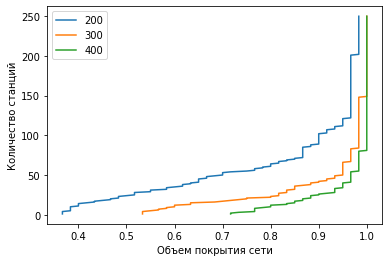

In [29]:
# plt.plot(sorted(graph_100.values()), graph_100.keys(), label = '100')
plt.xlabel('Объем покрытия сети')
plt.ylabel('Количество станций')
plt.plot(sorted(graph_200.values()), graph_200.keys(), label = '200')
plt.plot(sorted(graph_300.values()), graph_300.keys(), label = '300')
plt.plot(sorted(graph_400.values()), graph_400.keys(), label = '400')
plt.legend()
plt.show

In [19]:
df = pd.DataFrame()

In [106]:
df['Number of stations'] = graph_10000.keys()

In [113]:
df['40 000'] = graph_40000.values()

In [30]:
df = pd.DataFrame()

In [32]:
np.random.seed(42)  # Set the seed to an arbitrary number
Routes_df = Routes_df.sample(n=60)

In [31]:
df['Number of stations'] = graph_200.keys()

In [32]:
df['200'] = sorted(graph_200.values())

In [33]:
df['300'] = sorted(graph_300.values())

In [34]:
df['400'] = sorted(graph_400.values())

In [35]:
df.to_excel('250 nodes (60).xlsx')